In [57]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random

from sklearn.preprocessing import StandardScaler, MinMaxScaler,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.decomposition import PCA
from sklearn.feature_selection import  VarianceThreshold

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Layer, BatchNormalization, Dropout
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

import torch
import torch.nn as nn
import torch.nn.functional as F


# # Optional: torch_geometric for graph layers
# try:
#     from torch_geometric.nn import GATConv
#     from torch_geometric.data import Data as GeoData
# except Exception:
#     GATConv = None
#     GeoData = None

def set_seeds(seed=42):
    """
    Sets the seed for reproducibility across Python, NumPy, and TensorFlow.
    """
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    # For newer versions of TF/Keras to ensure deterministic behavior on GPU if possible
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    print(f"Random seed set to: {seed}")
set_seeds(42)


Random seed set to: 42


# 25-26


## Data Prep


In [58]:
data_25_26 = pd.read_csv('https://raw.githubusercontent.com/ilyandho/FPL-Optimal-Transfer/refs/heads/FantasyGo/Prediction%20with%20Affine%20PNN/data/rolled_player_data.csv')
gw=22

cols = [

    'fpl_id', 'round', 'fpl_name', 'position', 'team_id', 'team', 'opponent_team', 'was_home', 'xP', #'xP_next',
    'selected_by_percent','value', 'form', 'value_form', 'transfers_in', 'transfers_out',  'selected', 'ownership_change', 'percenatge_net_transfers',
    'cbitr_volume_90', 'cbitr_probability','elo',  'team_h_difficulty', 'team_a_difficulty', 'win_prob', 'draw_prob', 'lose_prob',

    'creativity_1', 'creativity_3', 'creativity_5', 'influence_1', 'influence_3', 'influence_5', 'threat_1', 'threat_3', 'threat_5', 'minutes_1', 'minutes_3',
    'minutes_5', 'pts_bonus_1', 'pts_bonus_3', 'pts_bonus_5', 'expected_goals_1', 'expected_goals_3',
    'expected_goals_5', 'expected_assists_1', 'expected_assists_3', 'expected_assists_5', 'xP_1', 'xP_3', 'xP_5', 'expected_goals_conceded_1',
    'expected_goals_conceded_3', 'expected_goals_conceded_5', 'goals_conceded_1', 'goals_conceded_3', 'goals_conceded_5', 'goals_scored_1', 'goals_scored_3',
    'goals_scored_5', 'shots_1', 'shots_3', 'shots_5', 'key_passes_1', 'key_passes_3', 'key_passes_5', 'npg_1', 'npg_3', 'npg_5', 'npxG_1', 'npxG_3', 'npxG_5',
    'goals_1', 'goals_3', 'goals_5', 'xG_1', 'xG_3', 'xG_5', 'xA_1', 'xA_3', 'xA_5', 'saves_1', 'saves_3', 'saves_5', 'starts_1', 'starts_3', 'starts_5',
    'yellow_cards_1', 'yellow_cards_3', 'yellow_cards_5', 'red_cards_1', 'red_cards_3', 'red_cards_5', 'assists_1', 'assists_3', 'assists_5', 'clean_sheets_1',
    'clean_sheets_3', 'clean_sheets_5', 'value_1', 'value_3', 'value_5', 'ict_index_1', 'ict_index_3', 'ict_index_5', 'selected_1', 'selected_3', 'selected_5',
    'transfers_in_1', 'transfers_in_3', 'transfers_in_5', 'transfers_out_1', 'transfers_out_3', 'transfers_out_5', 'ownership_change_1', 'ownership_change_3',
    'ownership_change_5', 'percenatge_net_transfers_1', 'percenatge_net_transfers_3', 'percenatge_net_transfers_5', 'xGChain_1', 'xGChain_3', 'xGChain_5',
    'xGBuildup_1', 'xGBuildup_3', 'xGBuildup_5', 'expected_goal_involvements_1', 'expected_goal_involvements_3', 'expected_goal_involvements_5', 'form_1', 'form_3',
    'form_5', 'clearances_blocks_interceptions_1', 'clearances_blocks_interceptions_3', 'clearances_blocks_interceptions_5', 'tackles_1', 'tackles_3', 'tackles_5',
    'recoveries_1', 'recoveries_3', 'recoveries_5', 'selected_by_percent_1',
    'selected_by_percent_3', 'selected_by_percent_5', 'strength_1', 'strength_3', 'strength_5', 'strength_overall_home_1', 'strength_overall_home_3',
    'strength_overall_home_5', 'strength_overall_away_1', 'strength_overall_away_3', 'strength_overall_away_5', 'strength_attack_home_1', 'strength_attack_home_3',
    'strength_attack_home_5', 'strength_attack_away_1', 'strength_attack_away_3', 'strength_attack_away_5', 'strength_defence_home_1', 'strength_defence_home_3',
    'strength_defence_home_5', 'strength_defence_away_1', 'strength_defence_away_3', 'strength_defence_away_5',

    'opp_elo', 'opp_clean_sheets', 'opp_strength'
    ]

data_25_26 = data_25_26.rename({'web_name': 'fpl_name'}, axis=1)

data_25_26 = data_25_26[ (data_25_26['minutes_3'] >= 15) ] #(data_25_26['minutes_1'] > 0) |

active_data = data_25_26[cols].copy()
active_data_ = active_data.copy()

CATEGORICAL_COLS = ['position', 'team', 'opponent_team']

# Initialize encoder
# handle_unknown='ignore' ensures new teams result in all-zero rows for those features
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Fit and transform the categorical columns
encoded_array = encoder.fit(active_data_[CATEGORICAL_COLS])

# Create a DataFrame with the encoded features
encoded_cols = encoder.get_feature_names_out(CATEGORICAL_COLS)
encoded_df = pd.DataFrame(
    encoder.transform(active_data_[CATEGORICAL_COLS]),
    columns=encoded_cols,
    index=active_data_.index
)


cols = [*cols, *encoded_cols]
# Combine with numerical data
active_data_ = pd.concat([active_data_, encoded_df], axis=1).drop(columns=CATEGORICAL_COLS)
active_data_

,fpl_id,round,fpl_name,team_id,was_home,xP,selected_by_percent,value,form,value_form,...,opponent_team_11.0,opponent_team_12.0,opponent_team_13.0,opponent_team_14.0,opponent_team_15.0,opponent_team_16.0,opponent_team_17.0,opponent_team_18.0,opponent_team_19.0,opponent_team_20.0
3,1.0,4,Raya,1.0,True,6.5,23.5,55.0,6.0,1.1,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,1.0,5,Raya,1.0,True,4.0,24.0,55.0,4.0,0.7,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,1.0,6,Raya,1.0,False,3.3,26.2,56.0,3.3,0.6,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
6,1.0,7,Raya,1.0,True,4.5,27.7,56.0,4.0,0.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
7,1.0,8,Raya,1.0,False,5.2,28.6,57.0,4.7,0.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6692,749.0,21,Mané,20.0,False,5.0,0.7,45.0,5.0,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6693,749.0,22,Mané,20.0,True,0.0,0.8,45.0,5.0,1.1,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
6738,783.0,22,Groß,6.0,True,0.0,0.0,55.0,1.0,0.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6748,791.0,22,Taty,19.0,False,0.0,0.0,55.0,2.0,0.4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


### Functions


In [59]:
# --- Step 1: Data Preparation Function ---
def prepare_fpl_data(data, cols):
    """
    Prepares features (X), conditional parameters (M), targets (Y),
    and gameweeks (GW) for the AffinePNN model.
    """
    cols_ = list(cols)
    # if 'team_difficulty' not in cols_:
    #     cols_.append('team_h_difficulty', 'team_a_difficulty')

    data_ = data.copy()

    # Target and metadata columns
    target_col = ['xP', 'fpl_name', ]
    gameweek_col = 'round'
    POSITION_COL = 'position'
    M_COLS = ['was_home', 'position_DEF', 'position_FWD', 'position_GK', 'position_MID','win_prob', 'draw_prob', 'lose_prob'] #, 'whh', 'whd', 'wha'

    # 2. Target Variable (Y)
    Y = data_[target_col].fillna(0)

    # 3. Input Features (X)
    EXCLUDE_COLS = [*target_col, gameweek_col, *M_COLS]

    # Find position-related columns for explicit inclusion if needed
    new_position_cols = [col for col in data_.columns if col.startswith(f'{POSITION_COL}_')]

    # Filter feature columns
    X_cols = [c for c in data_.columns if c not in EXCLUDE_COLS and c != POSITION_COL]

    # Final check of column existence
    X_cols = [col for col in X_cols if col in data_.columns]

    # Convert to numpy
    X_ids = data_['fpl_id'].values
    X = data_[X_cols].drop(columns=['fpl_id', 'team_id'])
    X = X.fillna(0).values.astype(np.float32)

    M = data_[M_COLS].fillna(0).values.astype(np.float32)
    GW = data_[gameweek_col].values



    print(f"Data prepared. X shape: {X.shape}, M shape: {M.shape}, Y shape: {Y.shape}")
    return X, M, Y, GW, X_cols, X_ids

def transform_data(final_df, cols, round):
    # Prepare data
    X_full, M_full, Y_full, GW_full, X_cols, X_ids = prepare_fpl_data(final_df, cols)
    # print(X_full.shape)
    # Split
    GW_TRAIN_END = round - 1
    GW_TRAIN_START = GW_TRAIN_END - 10
    train_mask = (GW_full >= GW_TRAIN_START) & (GW_full <= GW_TRAIN_END)
    test_mask = GW_full == (GW_TRAIN_END + 1)

    X_train, M_train, Y_train_raw = X_full[train_mask], M_full[train_mask], Y_full[train_mask]
    X_test, M_test, Y_test_raw, X_test_ids = X_full[test_mask], M_full[test_mask], Y_full[test_mask], X_ids[test_mask]

    Y_train = Y_train_raw['xP'].values
    Y_train_names = Y_train_raw['fpl_name'].values

    Y_test = Y_test_raw['xP'].values
    Y_test_names = Y_test_raw['fpl_name'].values

    # Scaling
    scaler_x = StandardScaler()
    X_train_scaled = scaler_x.fit_transform(X_train)

    if X_test.size > 0:
        X_test_scaled = scaler_x.transform(X_test)
    else:
        X_test_scaled = scaler_x

    scaler_m = StandardScaler()
    M_train_scaled = scaler_m.fit_transform(M_train)

    if M_test.size > 0:
        M_test_scaled = scaler_m.transform(M_test)
    else:
        M_test_scaled = scaler_m

    # Scale Y if needed
    scaler_y = MinMaxScaler()
    Y_train_scaled = scaler_y.fit_transform(Y_train.reshape(-1, 1)).flatten()

    # print('----', Y_train)

    return (X_train_scaled, M_train_scaled, train_mask, Y_train, Y_train_names), (X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names, X_test_ids), GW_full, X_cols, scaler_y#, scaler_x, scaler_m


In [ ]:

# --- Step 2: Custom Affine Conditioning Layer ---
class AffineConditioning(Layer):
    """
    Custom Keras Layer implementing the core Affine Parametric Neural Network (AffinePNN) logic.
    z = (phi * m + s0) * x + (psi * m + b0)
    """
    def __init__(self, units, activation=None, **kwargs):
        super(AffineConditioning, self).__init__(**kwargs)
        self.units = units
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        # input_shape: [feature_input_shape, parameter_input_shape]
        feature_dim = input_shape[0][-1]
        param_dim = input_shape[1][-1]

        # Weights to transform the parameter 'm' into scale and bias adjustments
        # Shape is (param_dim, feature_dim) to map conditions to feature space
        self.phi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='phi')
        self.psi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='psi')

        # Base scaling and bias
        # self.s0 = self.add_weight(shape=(feature_dim,), initializer='ones', trainable=True, name='s0')
        self.b0 = self.add_weight(shape=(feature_dim,), initializer='zeros', trainable=True, name='b0')

        self.built = True

    def call(self, inputs):
        x_in, m = inputs # x_in: (batch, feat), m: (batch, cond)

        # Calculate scale and bias based on conditional input m
        # (batch, cond) @ (cond, feat) -> (batch, feat)
        s_m = tf.matmul(m, self.phi)
        b_m = tf.matmul(m, self.psi)

        s = 1.0 + 0.5 * tf.tanh(s_m) # s_m + self.s0
        b = b_m + self.b0

        # Apply affine transformation
        x_out = s * x_in + b

        if self.activation is not None:
            return self.activation(x_out)
        return x_out

    def get_config(self):
        config = super(AffineConditioning, self).get_config()
        config.update({
            'units': self.units,
            'activation': tf.keras.activations.serialize(self.activation),
        })
        return config

# --- Step 3: Model Architecture ---
def build_affine_pnn(input_dim_x, input_dim_m, output_dim_y, hidden_units=128):
    """
    Builds the Affine Parametric Neural Network (AffinePNN) Model.
    """
    L2_REG = 0.005
    DROPOUT_RATE = 0.15

    X_input = Input(shape=(input_dim_x,), name='X_input')
    M_input = Input(shape=(input_dim_m,), name='M_input')

    # Initial Dense Layer
    x = Dense(hidden_units, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_1')(X_input)
    x = BatchNormalization()(x)
    # Affine Conditioning Block 1
    x = AffineConditioning(units=hidden_units, activation='tanh', name='Affine_Cond_1')([x, M_input])
    x = Dropout(DROPOUT_RATE)(x) # Added dropout for better generalization

    # Standard Dense Layer
    x = Dense(hidden_units // 2, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_2')(x)

    # Affine Conditioning Block 2
    x = AffineConditioning(units=hidden_units // 2, activation='relu', name='Affine_Cond_2')([x, M_input])

    # Final Prediction Layer
    output = Dense(output_dim_y,
                activation='sigmoid',
                name='Output')(x)

    model = Model(inputs=[X_input, M_input], outputs=output, name='AffinePNN_FPL')
    return model

def plot_training_history(history):
    """
    Plots the training and validation loss/metrics including MSE.
    """
    metrics = ['loss', 'mae', 'mse']
    plt.figure(figsize=(18, 5))

    for i, metric in enumerate(metrics):
        plt.subplot(1, 3, i + 1)
        plt.plot(history.history[metric], label='Train')
        plt.plot(history.history[f'val_{metric}'], label='Validation')
        plt.title(f'Model {metric.upper()}')
        plt.xlabel('Epoch')
        plt.ylabel(metric.upper())
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

def apnn_trainer(data, cols, round):
    train_data, test_data , GW_full, X_cols,scaler_y = transform_data(data, cols, round)
    X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
    X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names, X_test_ids = test_data


    # Reduce features with low variance (nearly constant)
    vt = VarianceThreshold(threshold=1e-4)
    X_train_clean = vt.fit_transform(X_train_scaled)
    X_test_clean = vt.transform(X_test_scaled)

    pca = PCA(n_components=0.80)  # keep 95% variance
    X_train_pca = pca.fit_transform(X_train_clean)
    X_test_pca = pca.transform(X_test_clean)

    y_min, y_max = Y_train.min(), Y_train.max()
    scaler_y = (y_max - y_min)
    # training
    y_train_scaled = (Y_train - y_min) / scaler_y

    Y_test_scaled = (Y_test - y_min) / scaler_y


    # Model Setup
    INPUT_DIM_X = X_train_pca.shape[1]
    INPUT_DIM_M = M_train_scaled.shape[1]
    OUTPUT_DIM_Y = 1

    model = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
    model.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

    # Callbacks
    # 1. Reduce Learning Rate on Plateau
    # Helps the model 'settle' into the global minimum during the final epochs.
    lr_reducer = tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=5, min_lr=1e-4, verbose=1
    )

    # 2. Early Stopping
    # Prevents overfitting by stopping once validation performance stops improving.
    early_stopper = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=10, min_delta=1e-4, restore_best_weights=True, verbose=1
    )

    # Training
    print("\nStarting Training...")
    history = model.fit(
        [X_train_pca, M_train_scaled], y_train_scaled,
        epochs=100, # Increased epochs with early stopping
        batch_size=32,
        validation_split=0.2,
        callbacks=[lr_reducer, early_stopper],
        verbose=1
    )

    evaluation_metrics_scaled = evaluator(model, X_test_pca, M_test_scaled, Y_test_scaled)

    test_loss = evaluation_metrics_scaled['test_loss']
    test_mae = evaluation_metrics_scaled['test_mae'] * scaler_y
    test_mse = evaluation_metrics_scaled['test_mse'] * scaler_y**2
    test_r2 = evaluation_metrics_scaled['test_R2']


    evaluation_metrics = {
        'test_loss': test_loss,
        'test_mae': test_mae,
        'test_mse': test_mse,
        'test_R2': test_r2
    }
    # Prediction
    print("\nGenerating Predictions...")
    Y_pred_scaled = model.predict([X_test_pca, M_test_scaled]).flatten()

    # inference
    Y_pred = Y_pred_scaled * scaler_y + y_min

    position = active_data['position'][test_mask]
    teams = active_data['team'][test_mask]
    players_preds = {'fpl_name': Y_test_names, 'fpl_id': X_test_ids, 'team': teams, 'position': position, 'Actual_xP': Y_test, 'Predicted_xP': Y_pred}
    preds_df = pd.DataFrame(players_preds)

    return history, evaluation_metrics, preds_df, scaler_y

def evaluator(model, X_test_scaled, M_test_scaled, Y_test):
    # 1. EVALUATE TEST SET PERFORMANCE using model.evaluate
    print("\nEvaluating test set performance...")
    test_results = model.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

    # Generate predictions to calculate R2 score manually
    Y_pred = model.predict([X_test_scaled, M_test_scaled]).flatten()
    r2 = r2_score(Y_test, Y_pred)

    evaluation_metrics = {
        'test_loss': test_results['loss'],
        'test_mae': test_results['mae'],
        'test_mse': test_results['mse'],
        'test_R2': r2
    }


    return evaluation_metrics

def plot_preds(preds_df, position, gw):
    Y_test_names = preds_df[preds_df['position'] == position]['fpl_name'].values
    Y_test = preds_df[preds_df['position'] == position]['Actual_xP'].values
    Y_pred = preds_df[preds_df['position'] == position]['Predicted_xP'].values

    # Convert names to positions on x-axis
    x = np.arange(len(Y_test_names))

    plt.figure(figsize=(14, 6))

    # Plot actual points
    plt.plot(x, Y_test, marker='o', linewidth=2, label='Actual Points')

    # Plot predicted points
    plt.plot(x, Y_pred, marker='x', linewidth=2, label='Predicted Points')

    # Improve readability
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()



    # Index positions for players
    x = np.arange(len(Y_test_names))

    # Width of each bar
    width = 0.31

    plt.figure(figsize=(14, 6))

    # Bars
    plt.bar(x - width/2, Y_test, width, label='Actual Points')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points')

    # Labels & formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Calculate absolute errors
    errors = np.abs(Y_test - Y_pred)

    # Index for players
    x = np.arange(len(Y_test_names))
    width = 0.31  # width of the bars

    plt.figure(figsize=(16, 6))

    # Plot Actual and Predicted points side-by-side
    plt.bar(x - width/2, Y_test, width, label='Actual Points', color='skyblue')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points', color='salmon')

    # Annotate absolute errors on top of predicted bars
    for i in range(len(Y_test_names)):
        plt.text(x[i] + width/2, Y_pred[i] + 0.1, f"{errors[i]:.2f}", ha='center', va='bottom', fontsize=8, rotation=90)

    # Labels and formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.ylabel("Points")
    plt.title(f"{position}: Actual vs Predicted Points per Player (with Absolute Error) (GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()


## Predictions


### GW 16


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.8865 - mae: 0.3709 - mse: 0.1651 - val_loss: 0.8172 - val_mae: 0.3255 - val_mse: 0.1262 - learning_rate: 1.0000e-04
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.7619 - mae: 0.2434 - mse: 0.0810 - val_loss: 0.7038 - val_mae: 0.1968 - val_mse: 0.0540 - learning_rate: 1.0000e-04
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.6784 - mae: 0.1603 - mse: 0.0391 - val_loss: 0.6317 - val_mae: 0.1233 - val_mse: 0.0243 - learning_rate: 1.0000e-04
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6195 - mae: 0.1171 - mse: 0.0228 - val_loss: 0.5786 - val_mae: 0.0923 - val_mse: 0.0139 - learning_rate: 1.0000e-04
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5694 - mae: 0.0973 - mse: 0.0152 - val_loss: 0.5331 - val_mae: 0.0798 - val_mse: 0.0103 - learning_rate: 1.0000e-04
Epoch 6/100
70/7

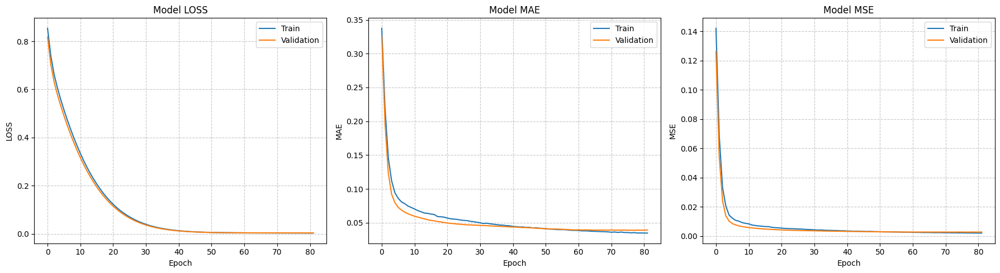


--- Final Test Set Evaluation (GW 22) ---
R²: 0.7945331935914968
MAE: 0.6200059946626425
MSE: 0.6668006566492840
Loss: 0.0044386368244886

--- Results for Gameweek 16 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
3730,Foden,414.0,Man City,MID,11.9,9.195744
2933,Wilson,329.0,Fulham,MID,8.8,9.054740
237,Merino,22.0,Arsenal,MID,6.8,7.889353
1940,Chalobah,226.0,Chelsea,DEF,7.2,7.808420
4087,B.Fernandes,449.0,Man Utd,MID,9.6,7.448662
...,...,...,...,...,...,...
1472,Ayari,166.0,Brighton,MID,1.1,1.070149
6291,Justin,706.0,Leeds,DEF,0.6,1.051030
5448,G.Rodriguez,618.0,West Ham,MID,0.6,1.034174
6216,Tchatchoua,695.0,Wolves,DEF,0.2,0.899490


In [61]:
history_16, evaluation_metrics_16, preds_df_16 = apnn_trainer(active_data_, cols, 16)
# Plot History
plot_training_history(history_16)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW {gw}) ---")
print(f"R²: {evaluation_metrics_16['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics_16['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics_16['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics_16['test_loss']:.16f}")


print("\n--- Results for Gameweek 16 ---")
preds_df_16.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


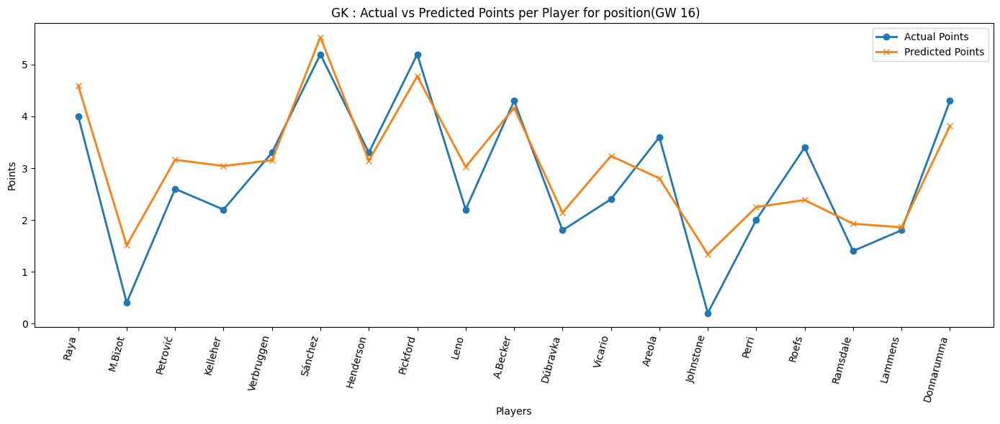

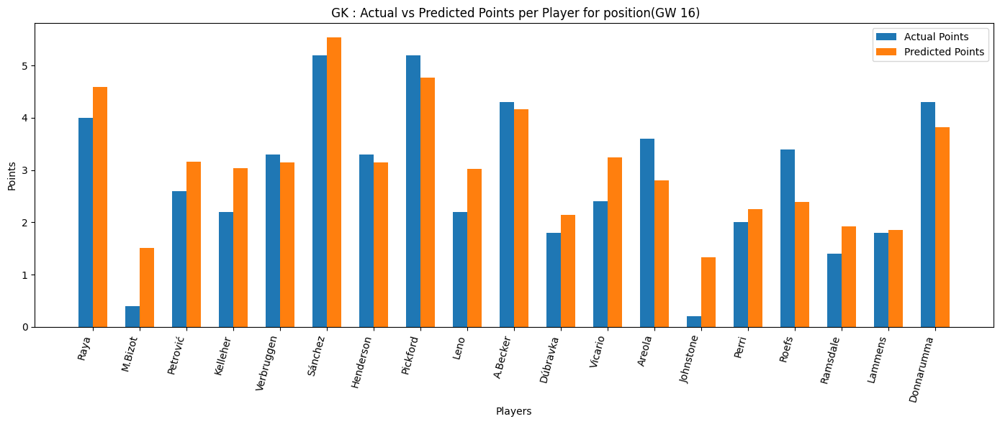

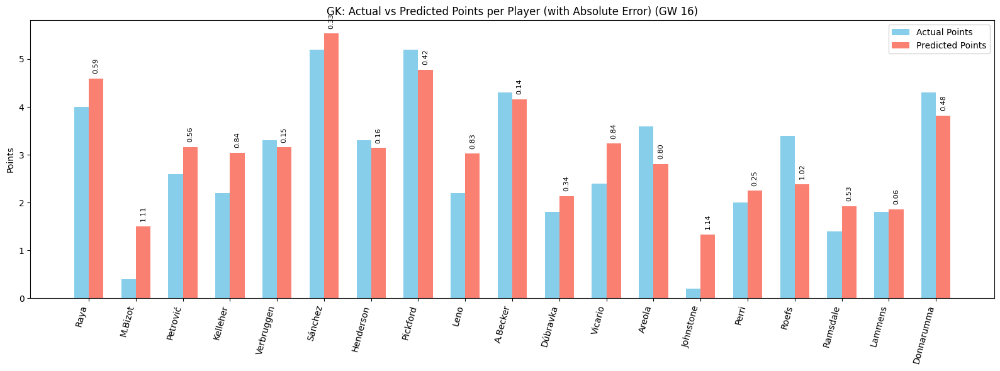

In [62]:
plot_preds(preds_df_16, 'GK', 16)


###### DEF


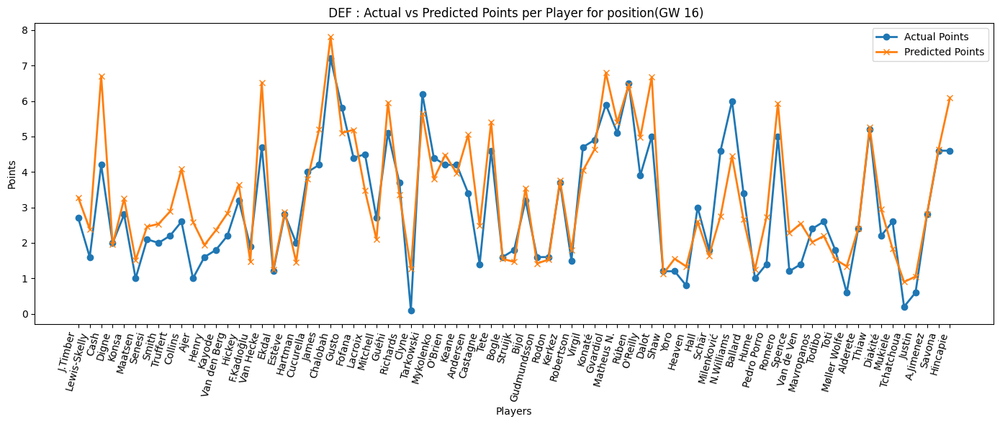

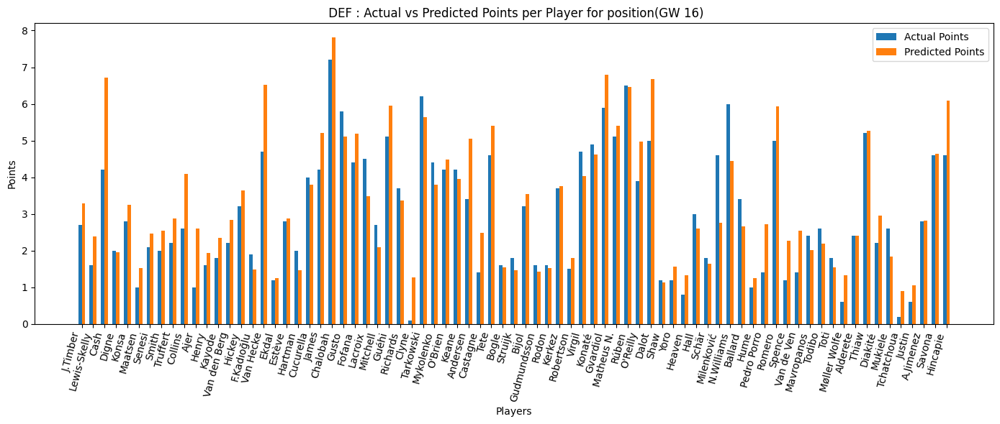

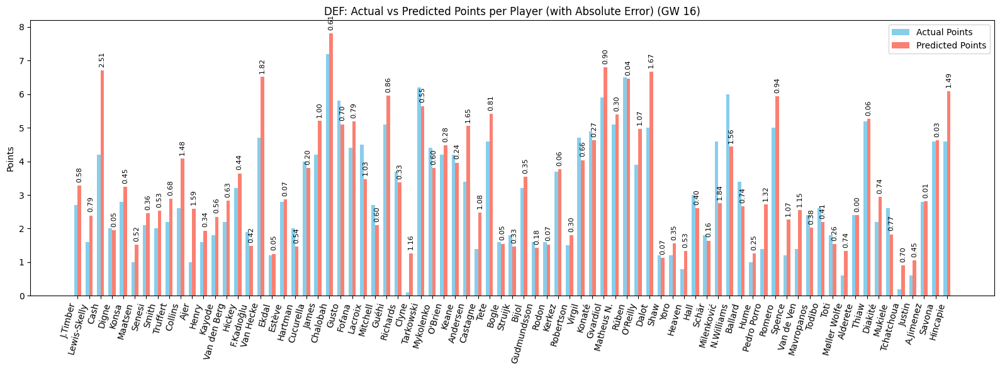

In [63]:
plot_preds(preds_df_16, 'DEF', 16)

###### MID


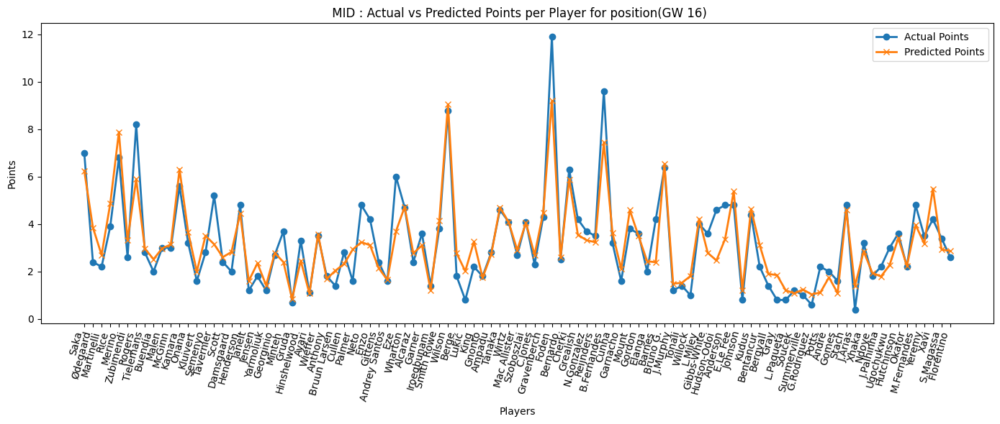

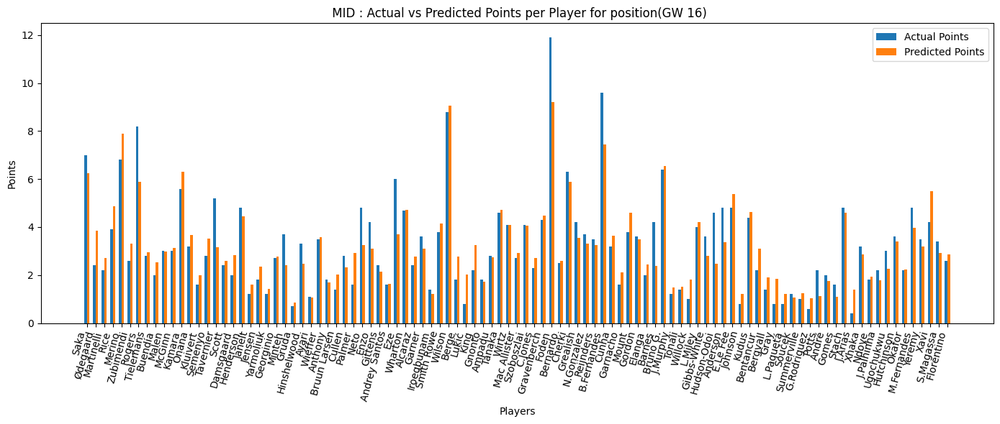

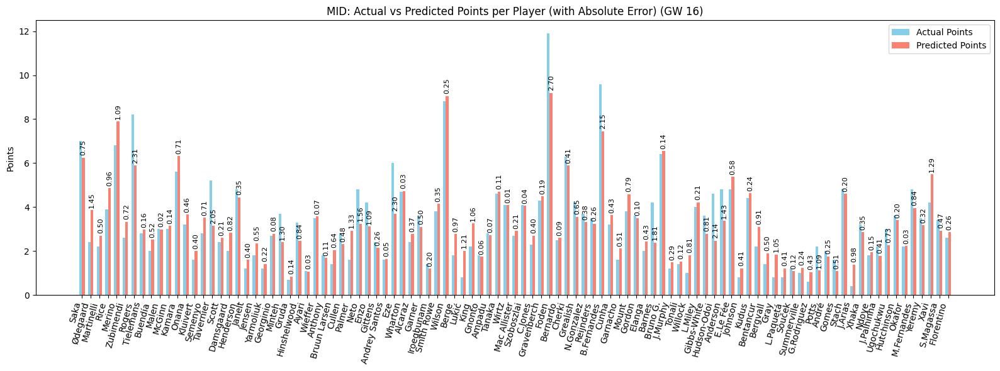

In [64]:
plot_preds(preds_df_16, 'MID', 16)

###### FWD


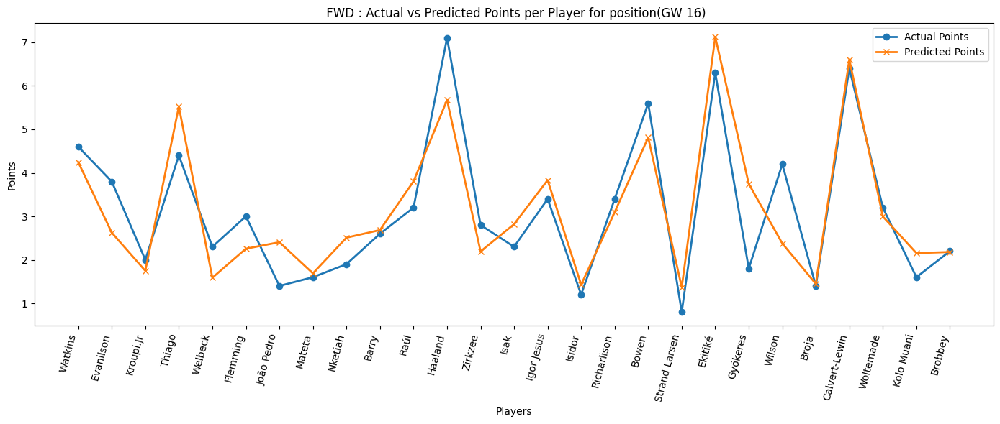

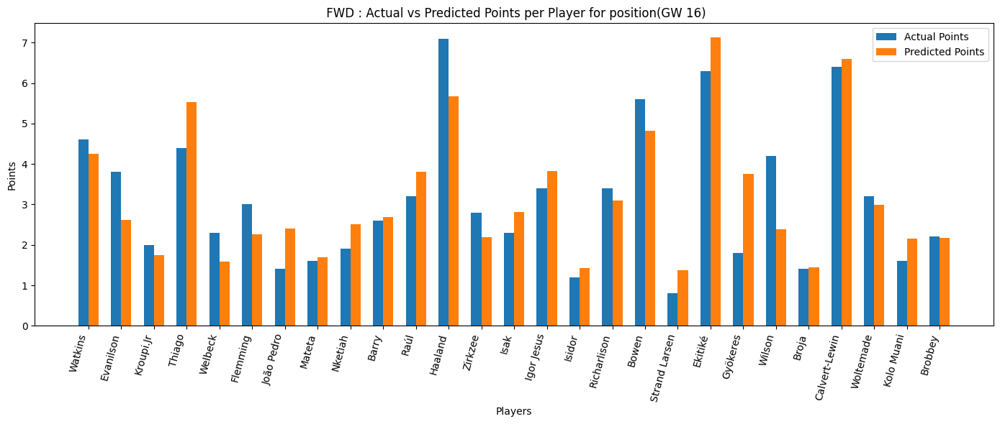

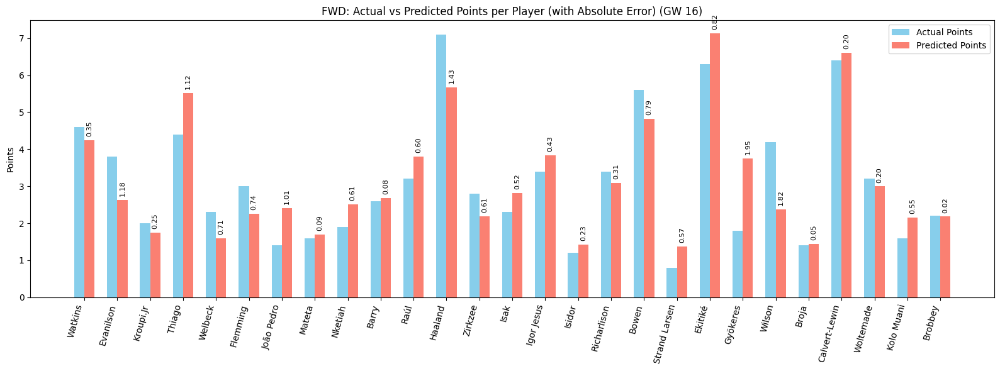

In [65]:
plot_preds(preds_df_16, 'FWD', 16)

### GW 17


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.7746 - mae: 0.2133 - mse: 0.0676 - val_loss: 0.7330 - val_mae: 0.2072 - val_mse: 0.0608 - learning_rate: 1.0000e-04
Epoch 2/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.6891 - mae: 0.1361 - mse: 0.0289 - val_loss: 0.6484 - val_mae: 0.1257 - val_mse: 0.0247 - learning_rate: 1.0000e-04
Epoch 3/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.6295 - mae: 0.1058 - mse: 0.0180 - val_loss: 0.5890 - val_mae: 0.0926 - val_mse: 0.0138 - learning_rate: 1.0000e-04
Epoch 4/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.5773 - mae: 0.0915 - mse: 0.0139 - val_loss: 0.5382 - val_mae: 0.0783 - val_mse: 0.0099 - learning_rate: 1.0000e-04
Epoch 5/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.5283 - mae: 0.0835 - mse: 0.0113 - val_loss: 0.4919 - val_mae: 0.0710 - val_mse: 0.0083 - learning_rate: 1.0000e-04
Epoch 6/100
69/6

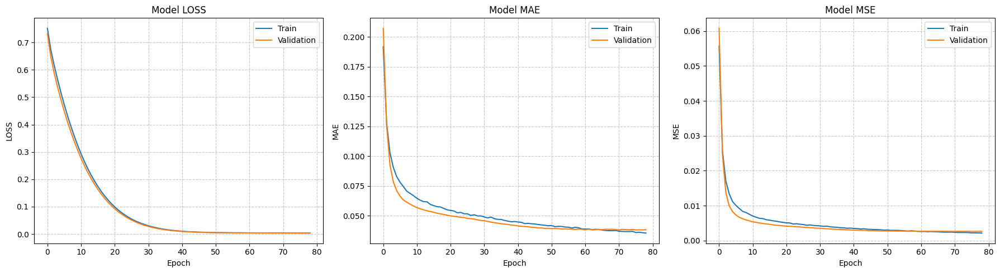


--- Final Test Set Evaluation (GW 22) ---
R²: 0.82370569059107679
MAE: 0.59936206787824631
MSE: 0.60287440857617181
Loss: 0.00411543855443597

--- Results for Gameweek 17 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
3731,Foden,414.0,Man City,MID,12.1,9.082959
5803,Ekitiké,661.0,Liverpool,FWD,7.9,8.664337
3917,Haaland,430.0,Man City,FWD,9.9,8.151207
2934,Wilson,329.0,Fulham,MID,8.8,8.007609
449,Rogers,47.0,Aston Villa,MID,8.2,7.702158
...,...,...,...,...,...,...
5645,Hee Chan,642.0,Wolves,MID,0.6,0.814476
5134,Johnson,580.0,Spurs,MID,0.3,0.787263
5205,Bergvall,586.0,Spurs,MID,1.3,0.783568
5449,G.Rodriguez,618.0,West Ham,MID,0.3,0.726228


In [66]:
history_17, evaluation_metrics_17, preds_df_17 = apnn_trainer(active_data_, cols, 17)
# Plot History
plot_training_history(history_17)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW {gw}) ---")
print(f"R²: {evaluation_metrics_17['test_R2']:.17f}")
print(f"MAE: {evaluation_metrics_17['test_mae']:.17f}")
print(f"MSE: {evaluation_metrics_17['test_mse']:.17f}")
print(f"Loss: {evaluation_metrics_17['test_loss']:.17f}")


print("\n--- Results for Gameweek 17 ---")
preds_df_17.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


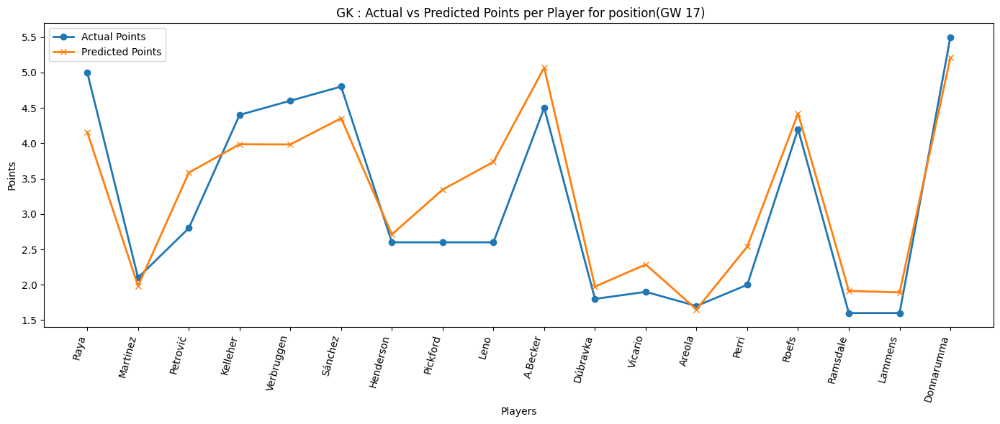

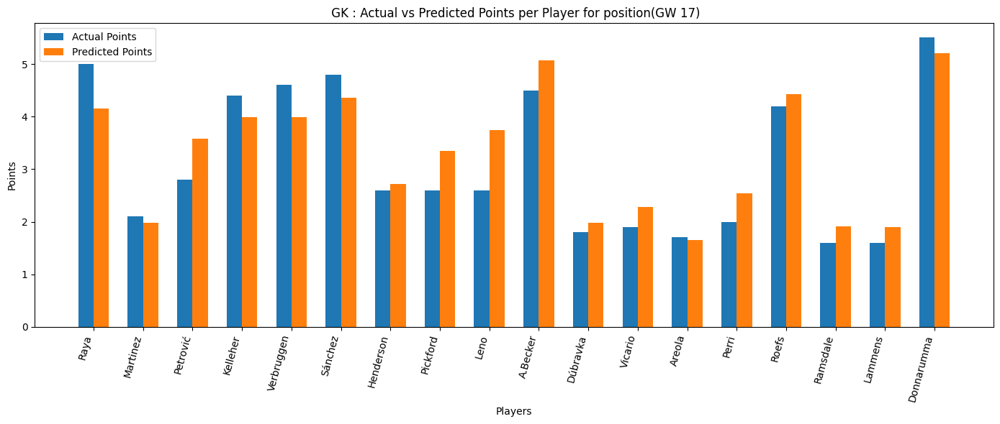

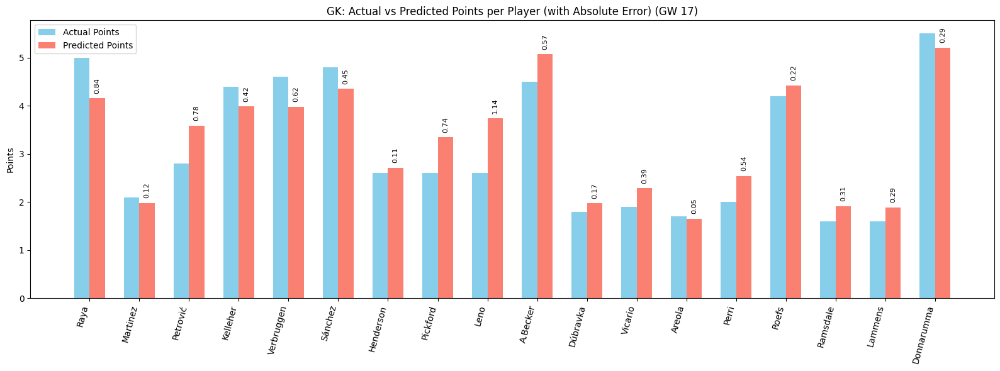

In [67]:
plot_preds(preds_df_17, 'GK', 17)


###### DEF


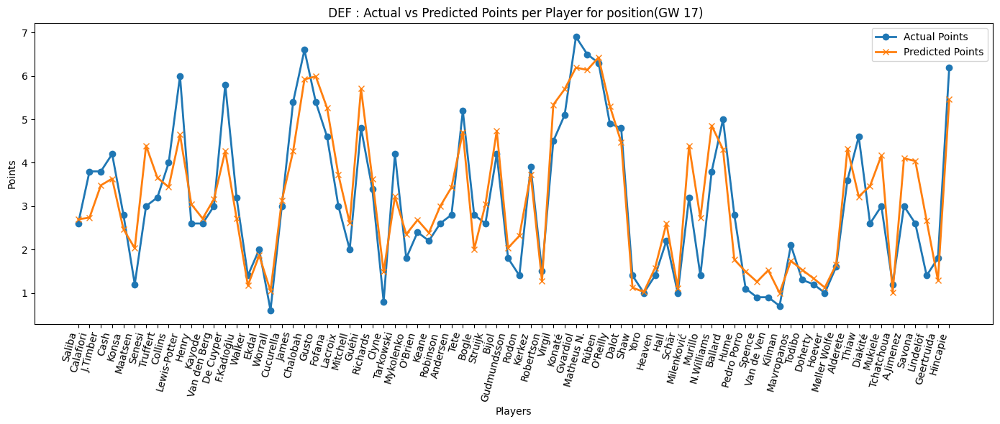

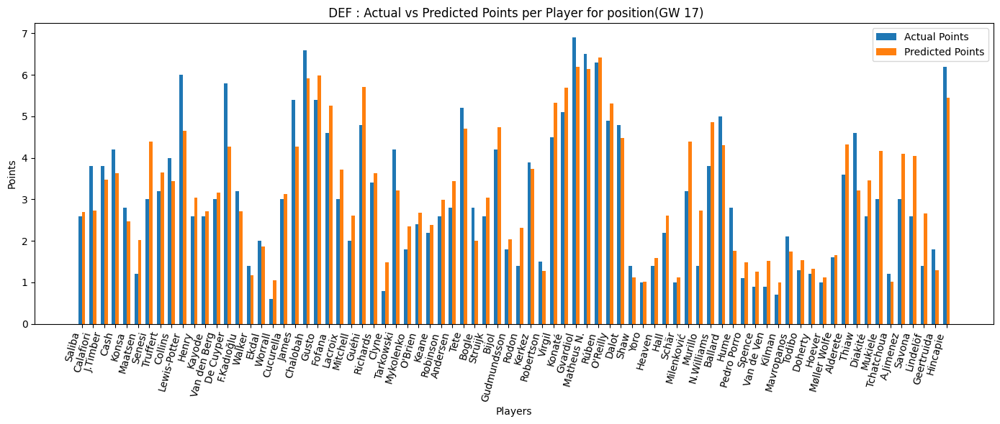

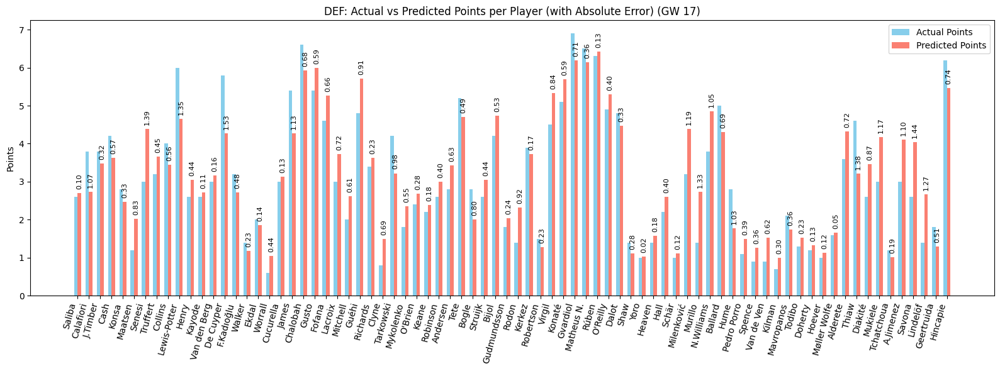

In [68]:
plot_preds(preds_df_17, 'DEF', 17)

###### MID


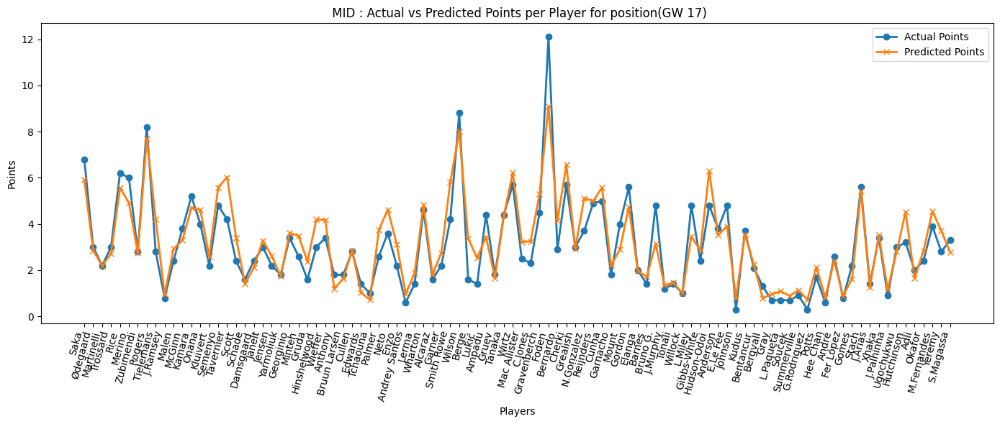

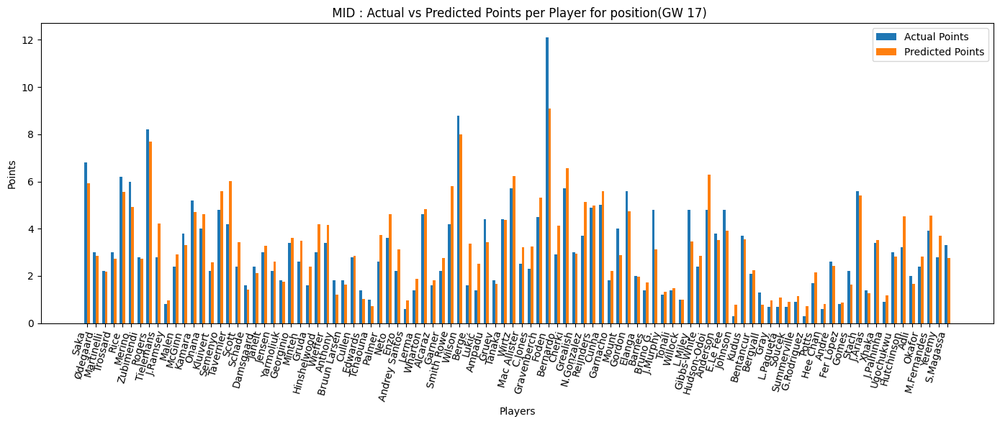

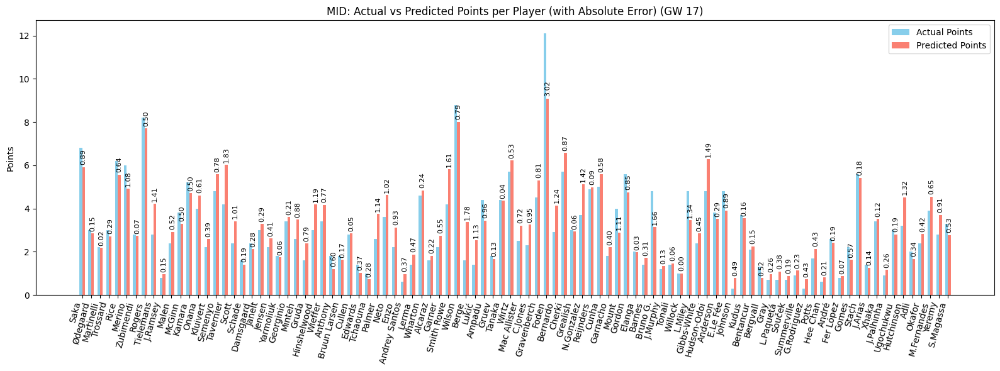

In [69]:
plot_preds(preds_df_17, 'MID', 17)

###### FWD


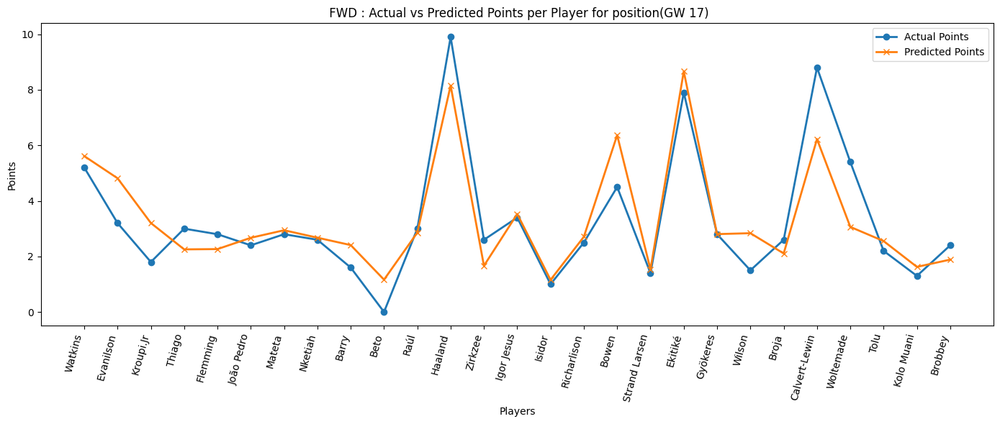

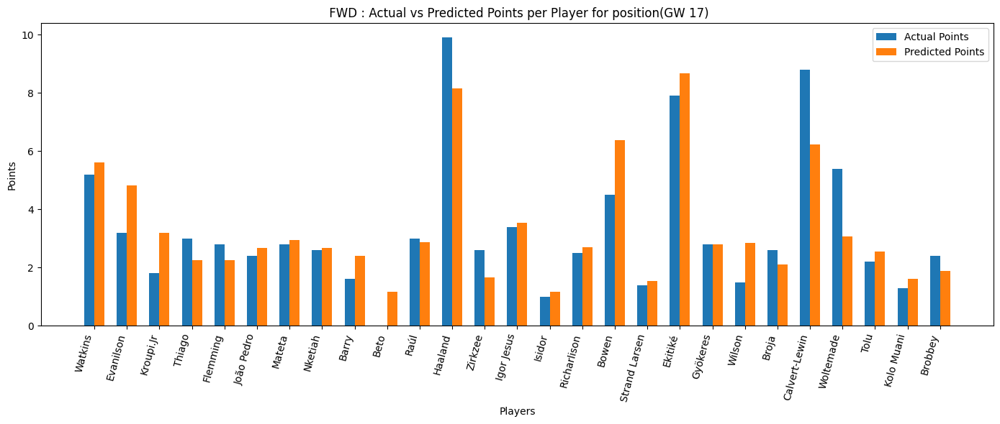

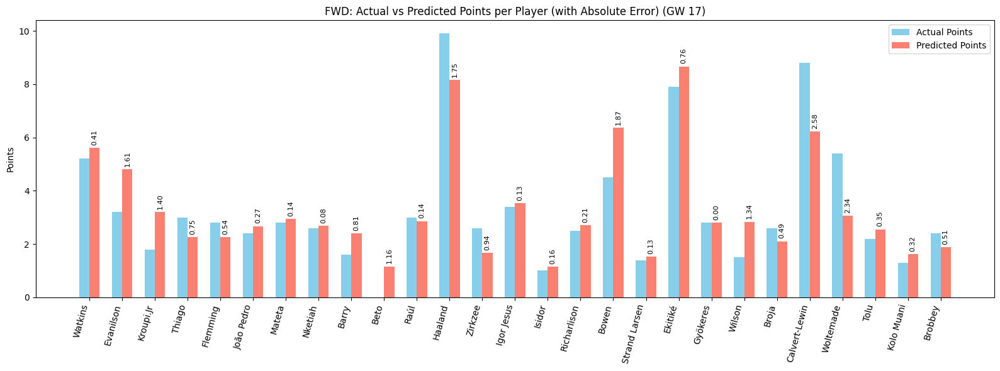

In [70]:
plot_preds(preds_df_17, 'FWD', 17)

### GW 18


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 0.7556 - mae: 0.1697 - mse: 0.0435 - val_loss: 0.7057 - val_mae: 0.1551 - val_mse: 0.0320 - learning_rate: 1.0000e-04
Epoch 2/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6809 - mae: 0.1124 - mse: 0.0206 - val_loss: 0.6358 - val_mae: 0.1024 - val_mse: 0.0153 - learning_rate: 1.0000e-04
Epoch 3/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6231 - mae: 0.0972 - mse: 0.0157 - val_loss: 0.5793 - val_mae: 0.0826 - val_mse: 0.0105 - learning_rate: 1.0000e-04
Epoch 4/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5698 - mae: 0.0889 - mse: 0.0134 - val_loss: 0.5284 - val_mae: 0.0742 - val_mse: 0.0087 - learning_rate: 1.0000e-04
Epoch 5/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5202 - mae: 0.0842 - mse: 0.0121 - val_loss: 0.4815 - val_mae: 0.0696 - val_mse: 0.0077 - learning_rate: 1.0000e-04
Epoch 6/100
68/68

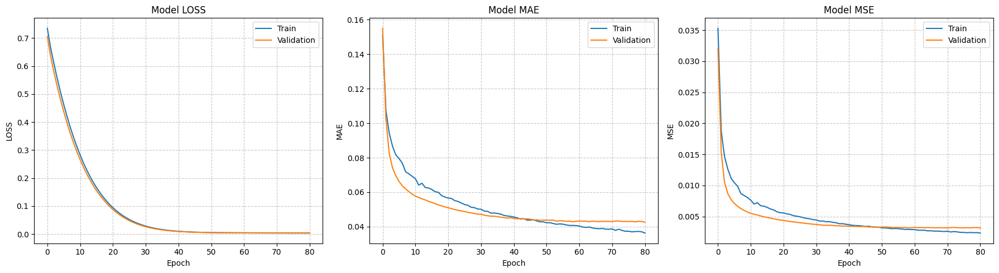


--- Final Test Set Evaluation (GW 18) ---
R²: 0.825476175156460767
MAE: 0.562537497282028176
MSE: 0.561909625595435558
Loss: 0.004314351826906204

--- Results for Gameweek 18 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
5804,Ekitiké,661.0,Liverpool,FWD,7.5,8.865106
3918,Haaland,430.0,Man City,FWD,9.9,8.286991
450,Rogers,47.0,Aston Villa,MID,7.0,8.107457
4104,Cunha,450.0,Man Utd,MID,4.5,7.031585
1961,Gusto,228.0,Chelsea,DEF,4.7,6.965799
...,...,...,...,...,...,...
1570,Welbeck,178.0,Brighton,FWD,0.1,0.932165
4727,Dominguez,519.0,Nott'm Forest,MID,0.3,0.899175
5587,Mosquera,634.0,Wolves,DEF,0.2,0.871690
1310,Dunk,146.0,Brighton,DEF,0.2,0.853036


In [71]:
history_18, evaluation_metrics_18, preds_df_18 = apnn_trainer(active_data_, cols, 18)
# Plot History
plot_training_history(history_18)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW 18) ---")
print(f"R²: {evaluation_metrics_18['test_R2']:.18f}")
print(f"MAE: {evaluation_metrics_18['test_mae']:.18f}")
print(f"MSE: {evaluation_metrics_18['test_mse']:.18f}")
print(f"Loss: {evaluation_metrics_18['test_loss']:.18f}")


print("\n--- Results for Gameweek 18 ---")
preds_df_18.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


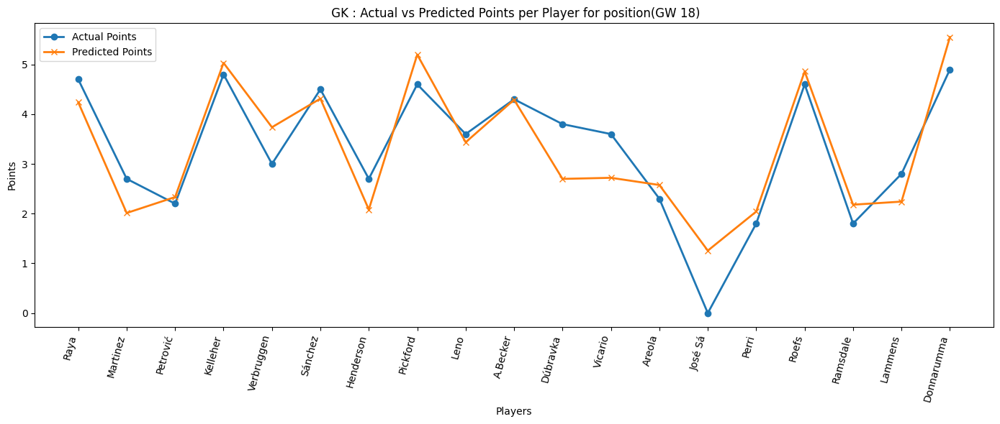

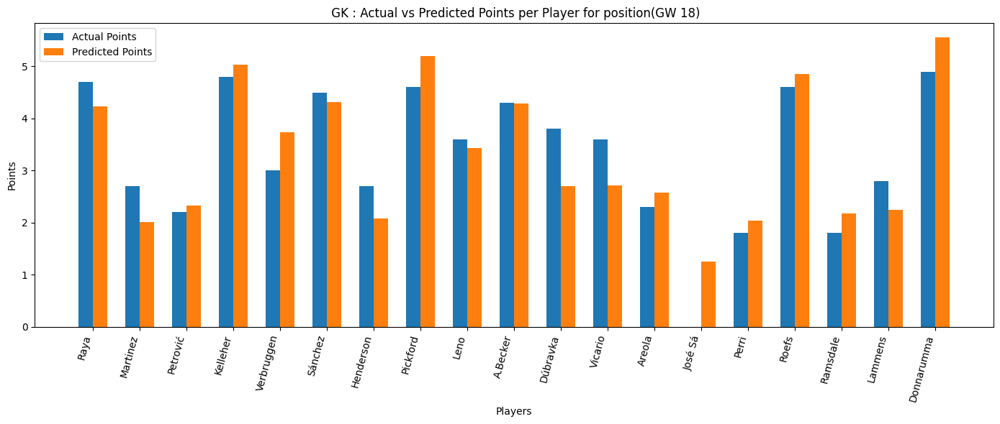

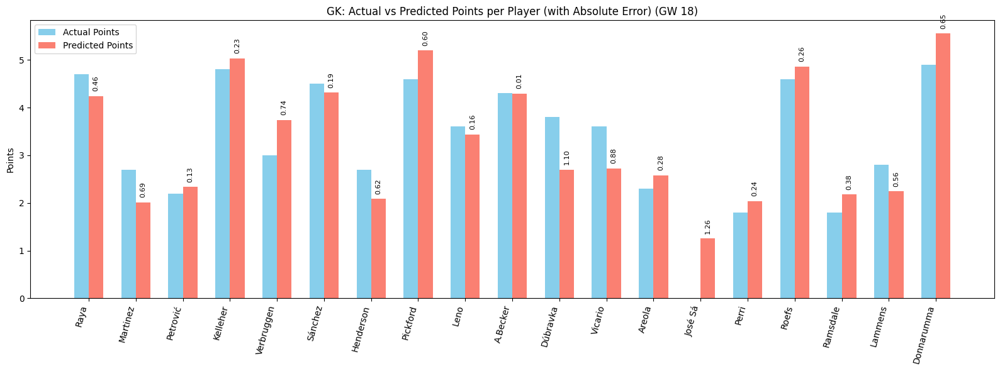

In [72]:
plot_preds(preds_df_18, 'GK', 18)


###### DEF


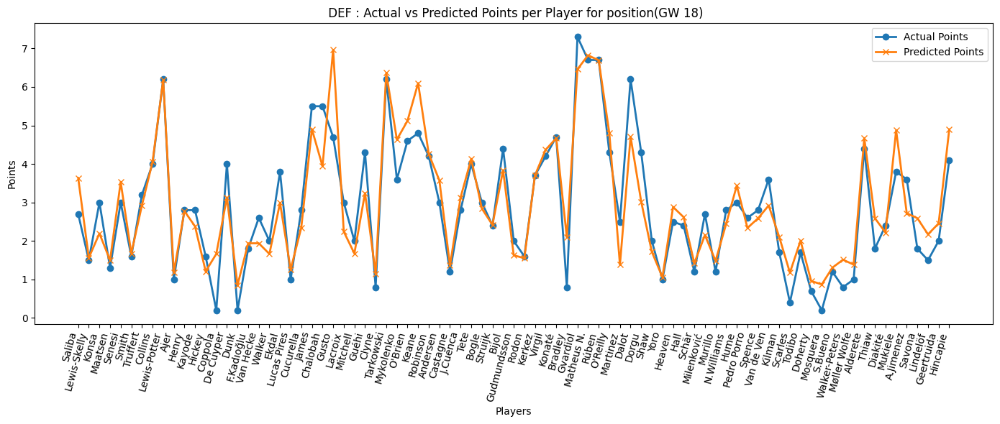

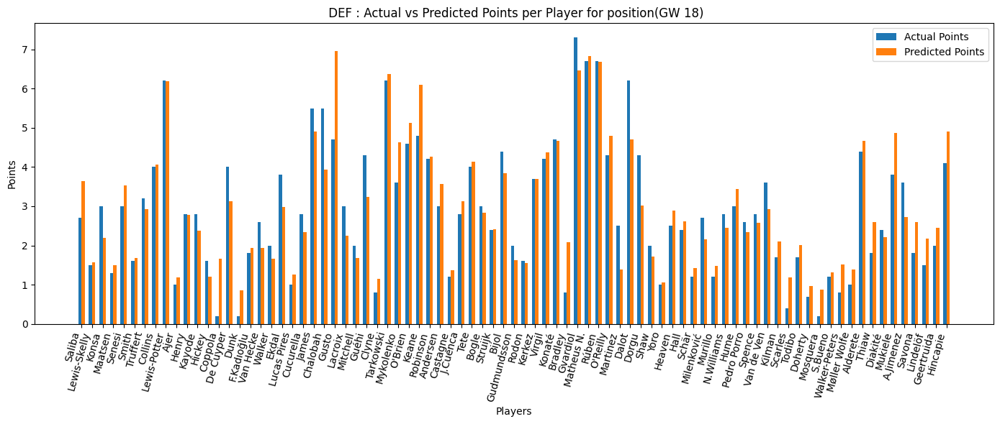

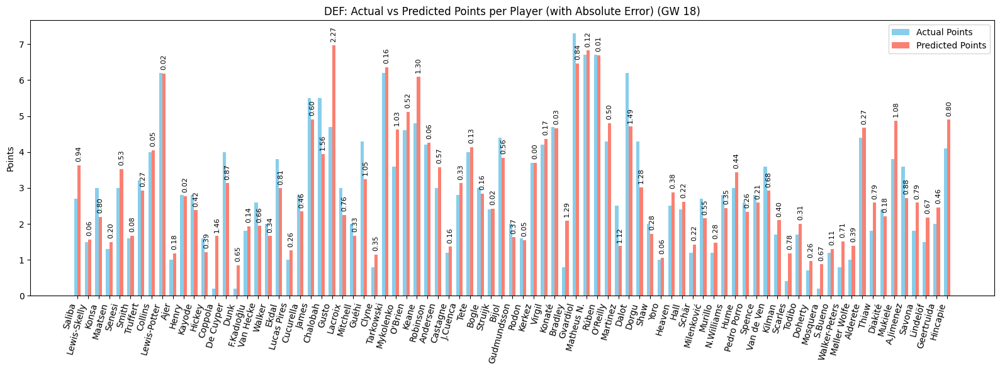

In [73]:
plot_preds(preds_df_18, 'DEF', 18)

###### MID


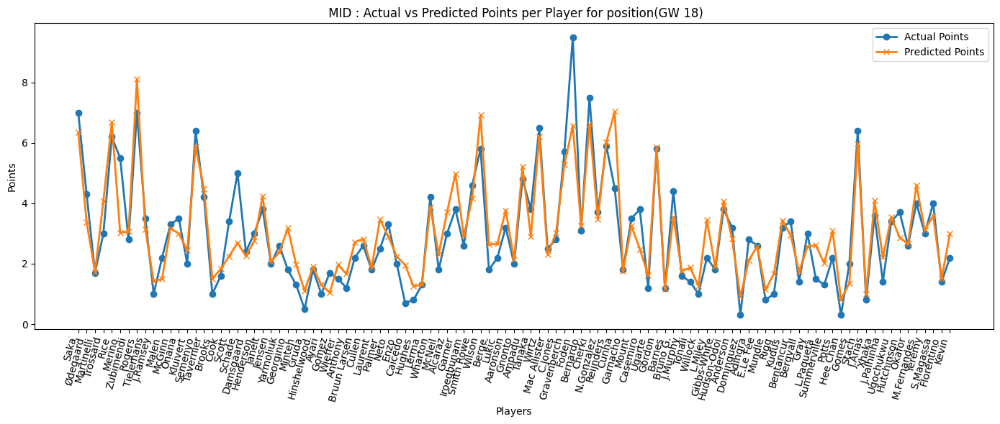

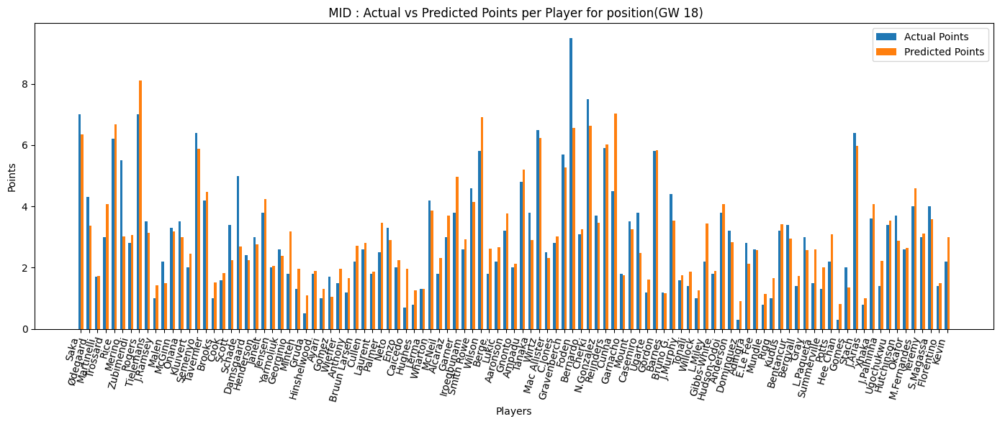

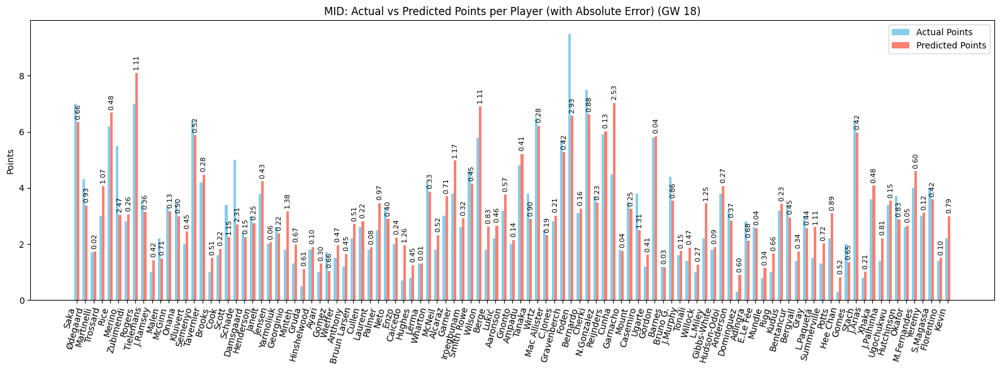

In [74]:
plot_preds(preds_df_18, 'MID', 18)

###### FWD


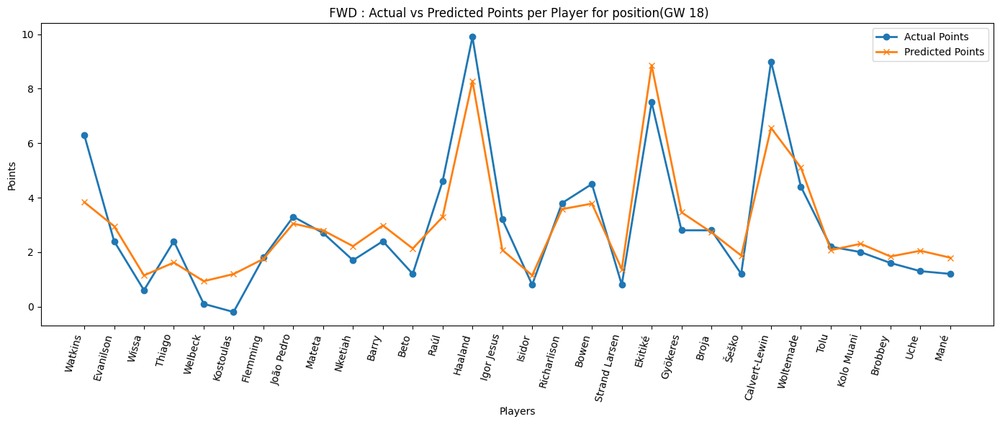

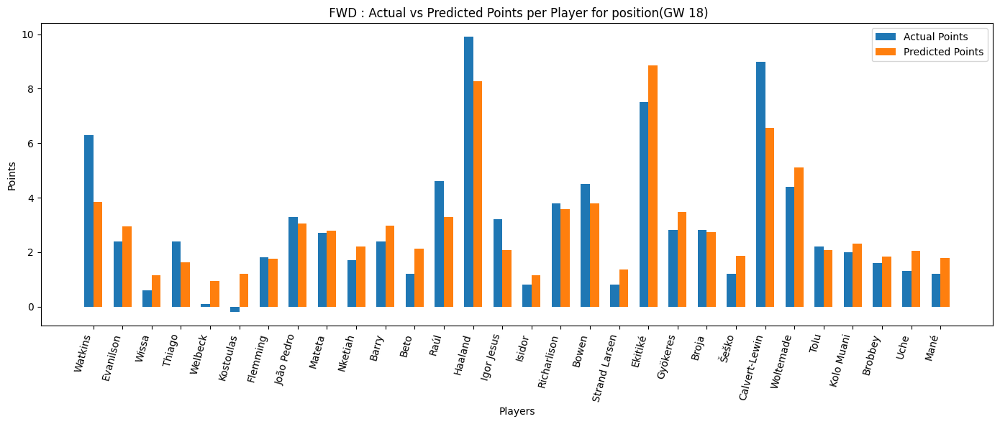

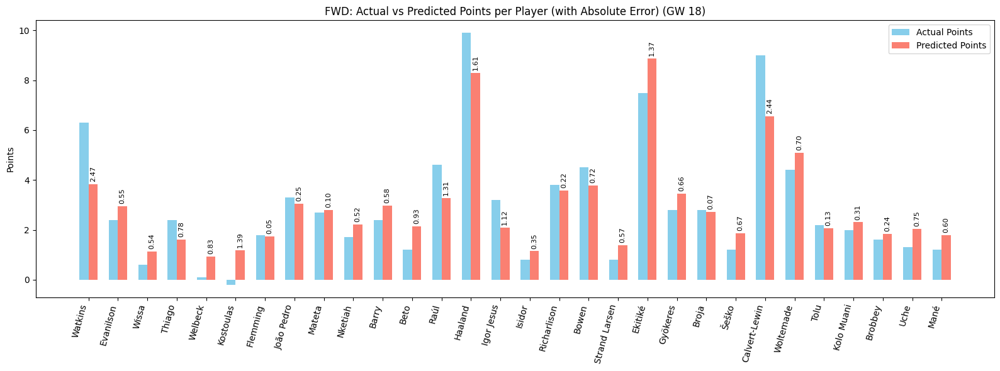

In [75]:
plot_preds(preds_df_18, 'FWD', 18)

### GW 19


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 0.8180 - mae: 0.2602 - mse: 0.1017 - val_loss: 0.8362 - val_mae: 0.3296 - val_mse: 0.1503 - learning_rate: 1.0000e-04
Epoch 2/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7253 - mae: 0.1719 - mse: 0.0498 - val_loss: 0.7051 - val_mae: 0.1946 - val_mse: 0.0614 - learning_rate: 1.0000e-04
Epoch 3/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6607 - mae: 0.1276 - mse: 0.0277 - val_loss: 0.6283 - val_mae: 0.1259 - val_mse: 0.0275 - learning_rate: 1.0000e-04
Epoch 4/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6106 - mae: 0.1099 - mse: 0.0205 - val_loss: 0.5750 - val_mae: 0.0979 - val_mse: 0.0166 - learning_rate: 1.0000e-04
Epoch 5/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5648 - mae: 0.0997 - mse: 0.0168 - val_loss: 0.5298 - val_mae: 0.0848 - val_mse: 0.0125 - learning_rate: 1.0000e-04
Epoch 6/100
68/68

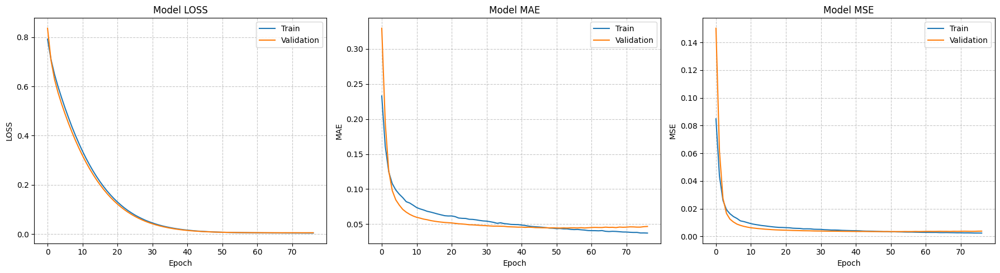


--- Final Test Set Evaluation (GW 22) ---
R²: 0.7846014534309958544
MAE: 0.6261484310030936973
MSE: 0.6502757886517793740
Loss: 0.0051538511179387569

--- Results for Gameweek 19 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
3919,Haaland,430.0,Man City,FWD,7.5,8.914891
3788,Cherki,417.0,Man City,MID,8.5,7.971895
5805,Ekitiké,661.0,Liverpool,FWD,8.9,7.824087
3609,Gvardiol,403.0,Man City,DEF,7.5,7.437406
6161,Calvert-Lewin,691.0,Leeds,FWD,6.9,7.182688
...,...,...,...,...,...,...
5559,Doherty,632.0,Wolves,DEF,1.8,0.714811
6078,Møller Wolfe,682.0,Wolves,DEF,1.4,0.692915
5647,Hee Chan,642.0,Wolves,MID,1.2,0.678554
6219,Tchatchoua,695.0,Wolves,DEF,0.8,0.643887


In [76]:
history_19, evaluation_metrics_19, preds_df_19 = apnn_trainer(active_data_, cols, 19)
# Plot History
plot_training_history(history_19)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW {gw}) ---")
print(f"R²: {evaluation_metrics_19['test_R2']:.19f}")
print(f"MAE: {evaluation_metrics_19['test_mae']:.19f}")
print(f"MSE: {evaluation_metrics_19['test_mse']:.19f}")
print(f"Loss: {evaluation_metrics_19['test_loss']:.19f}")


print("\n--- Results for Gameweek 19 ---")
preds_df_19.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


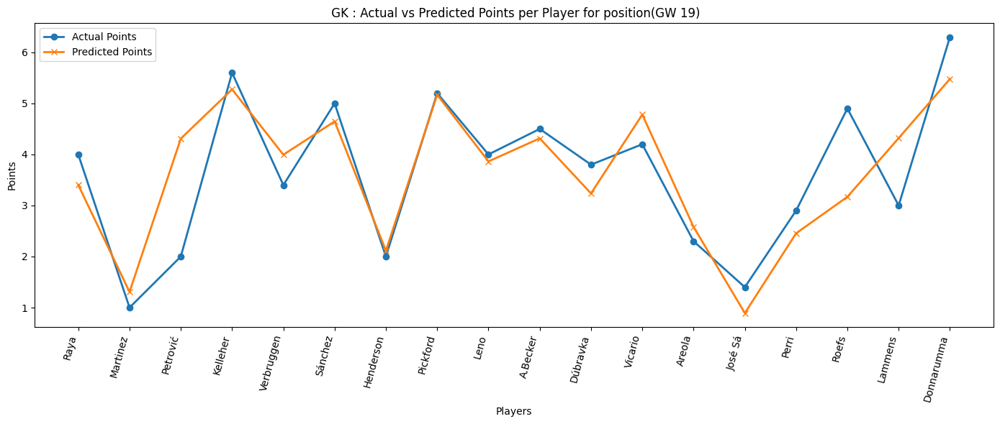

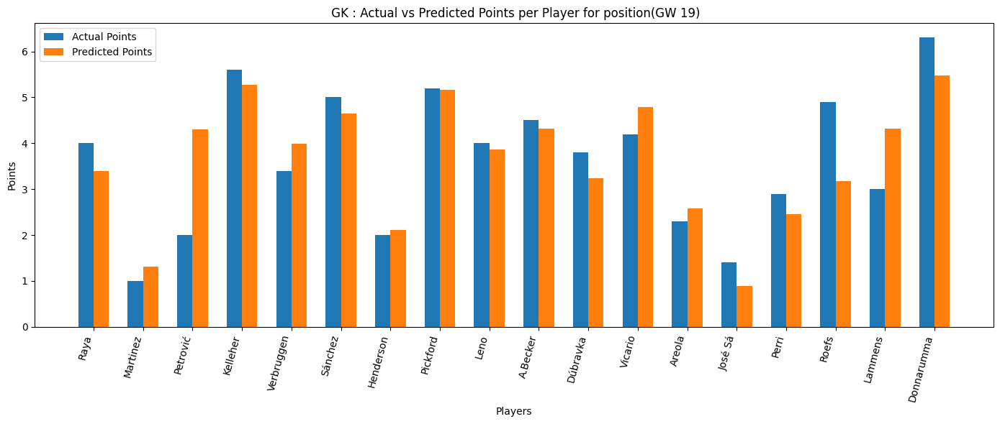

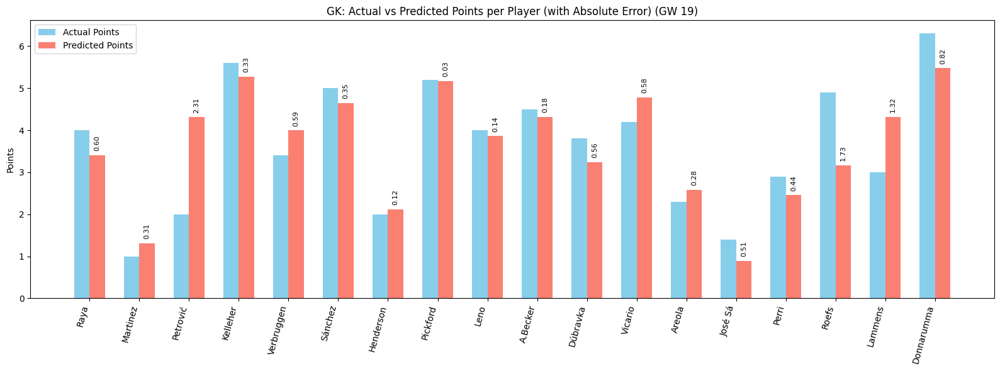

In [77]:
plot_preds(preds_df_19, 'GK', 19)


###### DEF


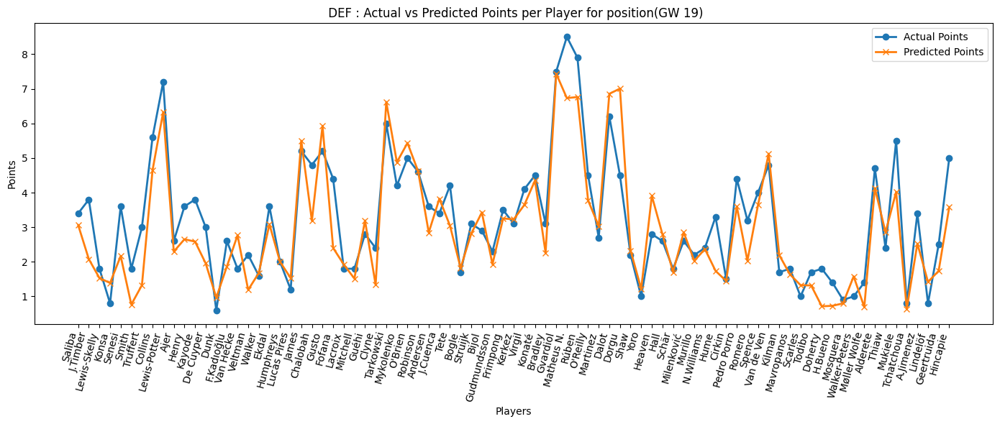

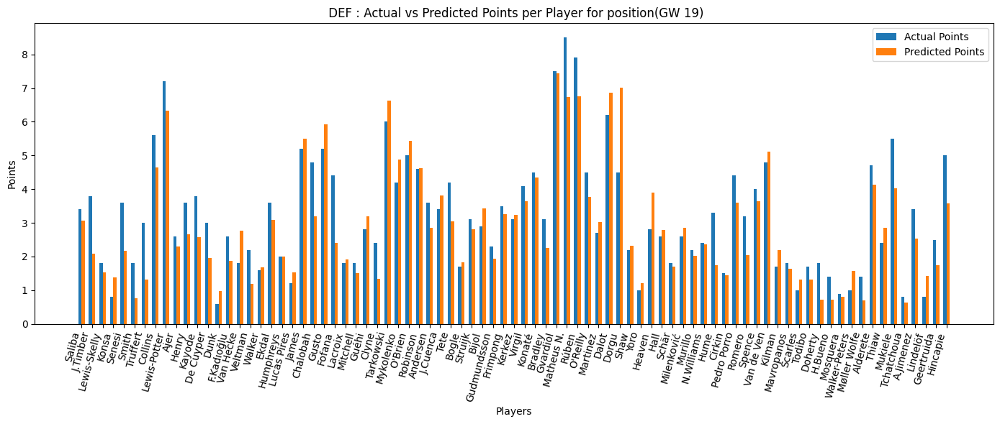

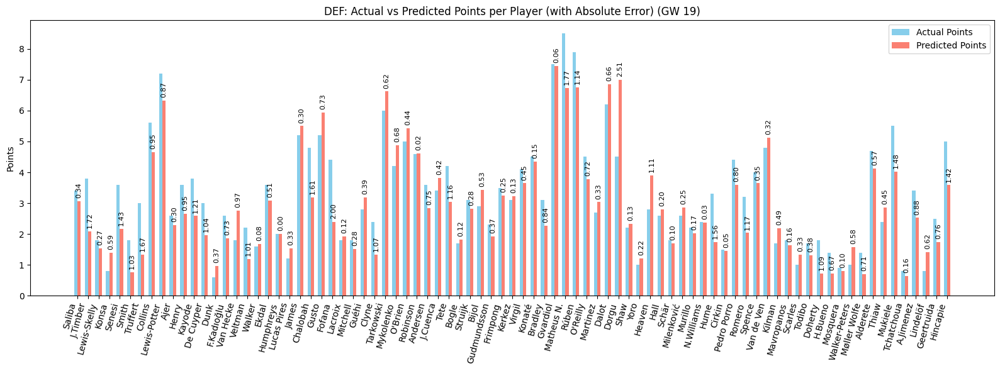

In [78]:
plot_preds(preds_df_19, 'DEF', 19)

###### MID


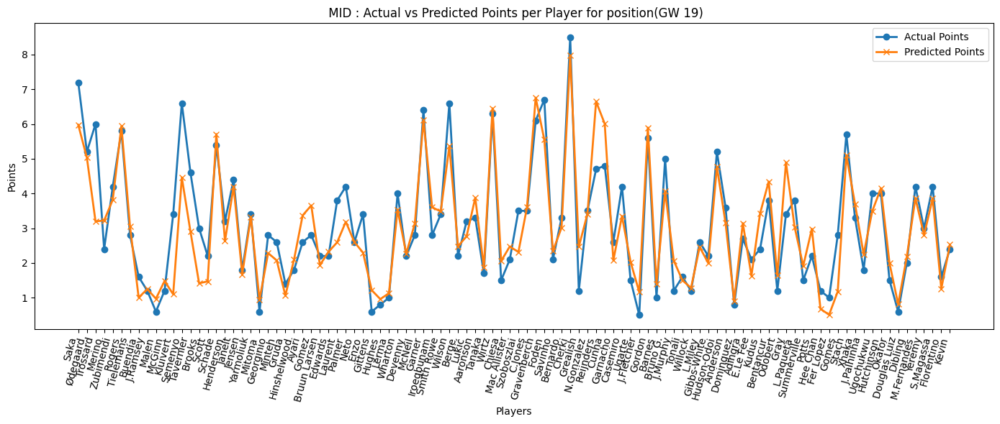

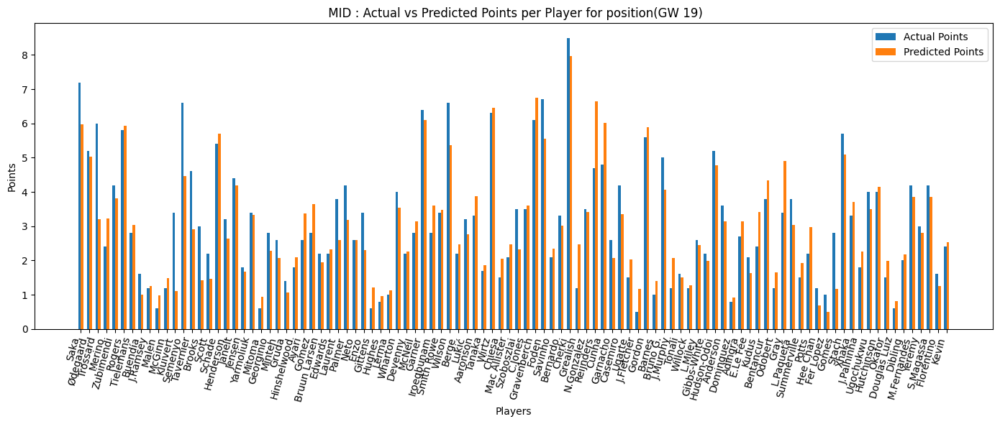

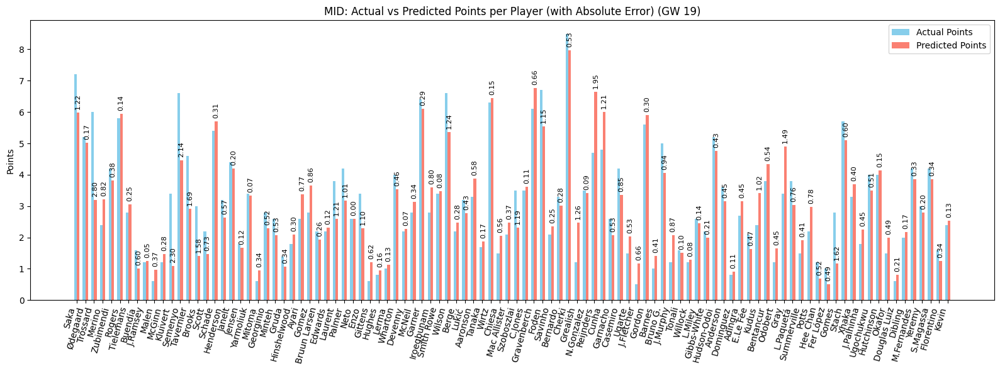

In [79]:
plot_preds(preds_df_19, 'MID', 19)

###### FWD


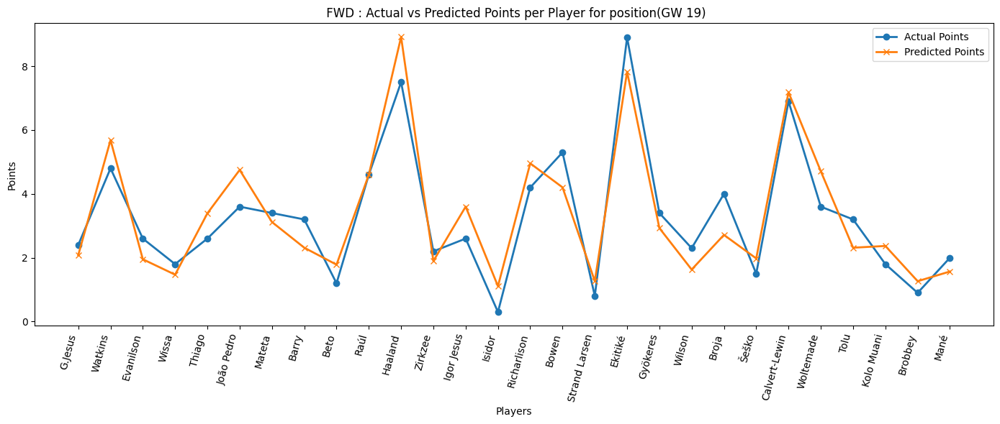

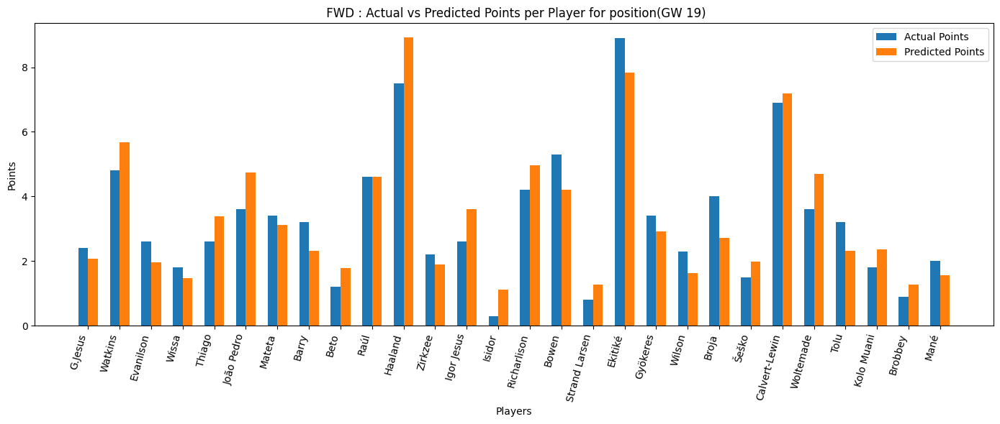

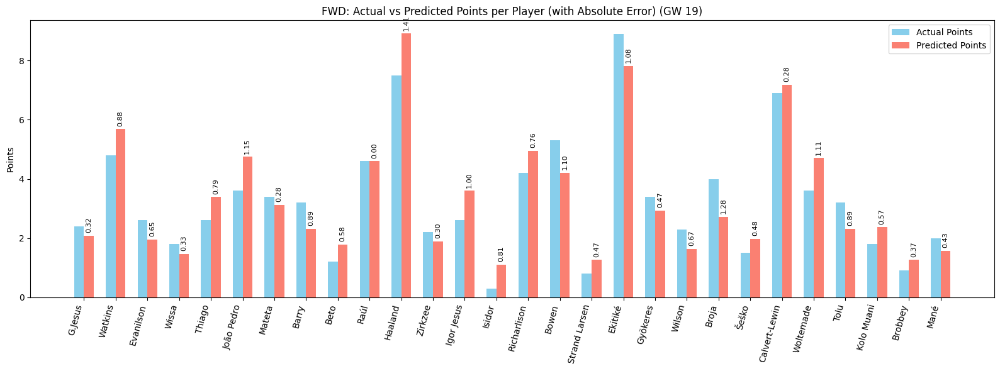

In [80]:
plot_preds(preds_df_19, 'FWD', 19)

### GW 20


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.7665 - mae: 0.2049 - mse: 0.0627 - val_loss: 0.7084 - val_mae: 0.1615 - val_mse: 0.0372 - learning_rate: 1.0000e-04
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6898 - mae: 0.1369 - mse: 0.0300 - val_loss: 0.6459 - val_mae: 0.1173 - val_mse: 0.0205 - learning_rate: 1.0000e-04
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6333 - mae: 0.1092 - mse: 0.0195 - val_loss: 0.5935 - val_mae: 0.0944 - val_mse: 0.0140 - learning_rate: 1.0000e-04
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5829 - mae: 0.0953 - mse: 0.0147 - val_loss: 0.5463 - val_mae: 0.0839 - val_mse: 0.0113 - learning_rate: 1.0000e-04
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5369 - mae: 0.0876 - mse: 0.0127 - val_loss: 0.5024 - val_mae: 0.0783 - val_mse: 0.0099 - learning_rate: 1.0000e-04
Epoch 6/100
67/6

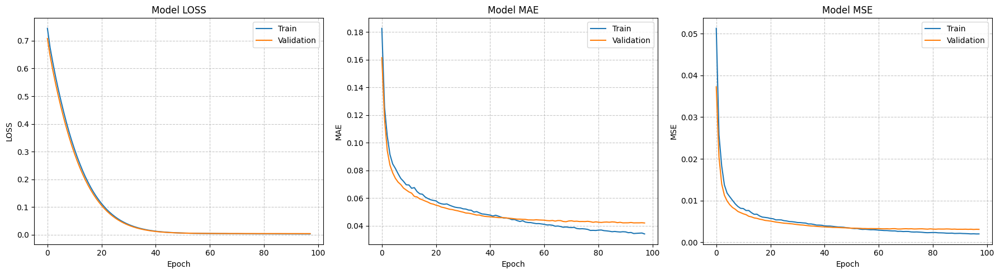


--- Final Test Set Evaluation (GW 22) ---
R²: 0.79066765758215462601
MAE: 0.59153279289603233337
MSE: 0.57879431324079633203
Loss: 0.00474540097638964653

--- Results for Gameweek 20 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
135,Saka,16.0,Arsenal,MID,7.2,7.736141
2662,Garner,303.0,Everton,MID,6.6,7.479786
35,Gabriel,5.0,Arsenal,DEF,6.0,7.079030
199,Trossard,20.0,Arsenal,MID,5.0,7.027666
3647,Matheus N.,407.0,Man City,DEF,7.5,7.020882
...,...,...,...,...,...,...
4729,Dominguez,519.0,Nott'm Forest,MID,1.4,0.802233
2814,Castagne,319.0,Fulham,DEF,0.2,0.783235
4902,Mundle,548.0,Sunderland,MID,1.0,0.742444
4918,Rigg,551.0,Sunderland,MID,1.2,0.736202


In [81]:
history_20, evaluation_metrics_20, preds_df_20 = apnn_trainer(active_data_, cols, 20)
# Plot History
plot_training_history(history_20)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW {gw}) ---")
print(f"R²: {evaluation_metrics_20['test_R2']:.20f}")
print(f"MAE: {evaluation_metrics_20['test_mae']:.20f}")
print(f"MSE: {evaluation_metrics_20['test_mse']:.20f}")
print(f"Loss: {evaluation_metrics_20['test_loss']:.20f}")


print("\n--- Results for Gameweek 20 ---")
preds_df_20.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


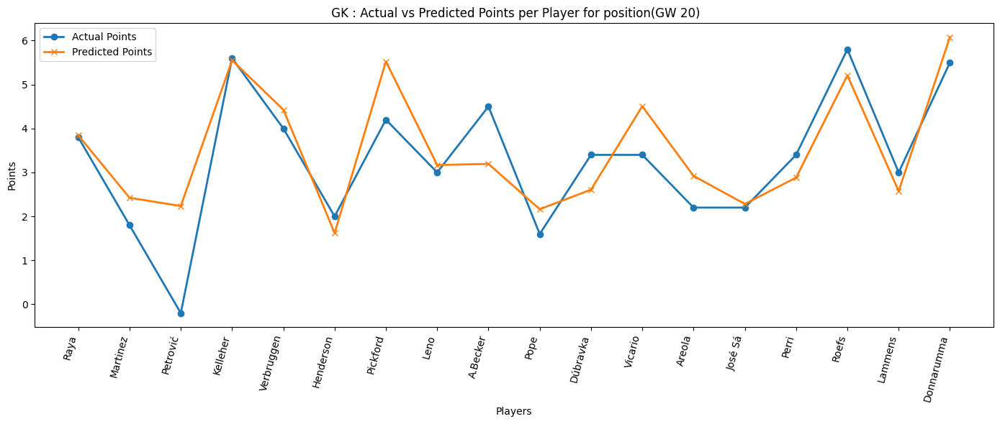

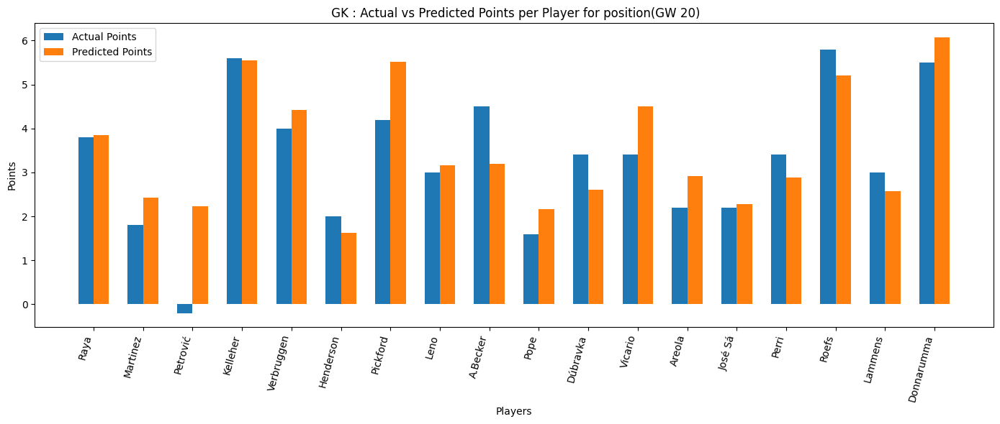

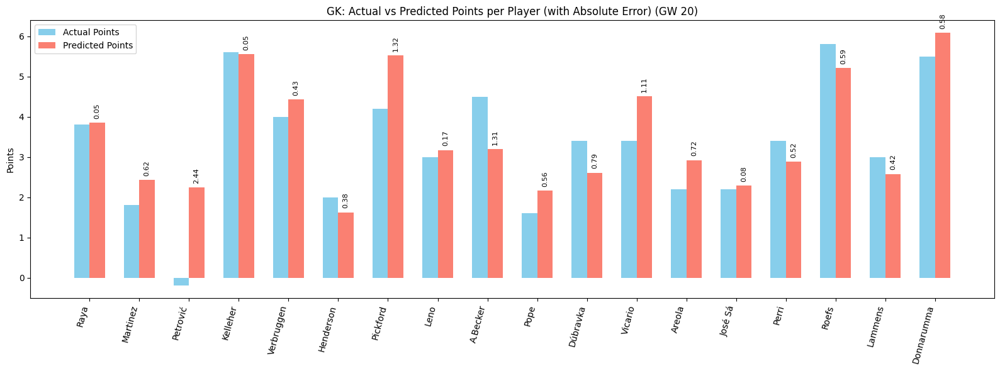

In [82]:
plot_preds(preds_df_20, 'GK', 20)


###### DEF


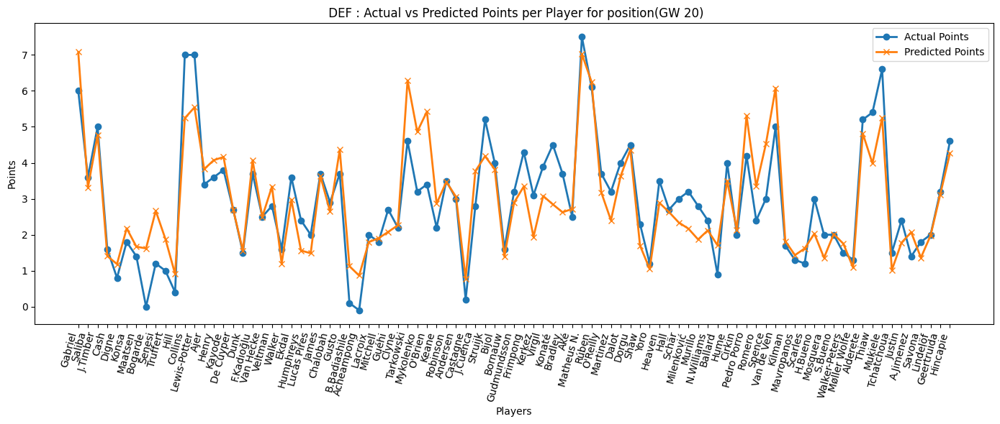

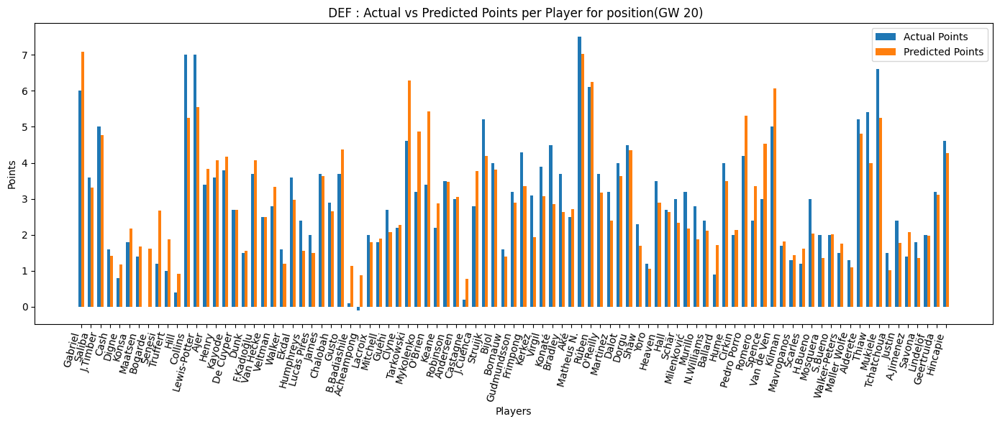

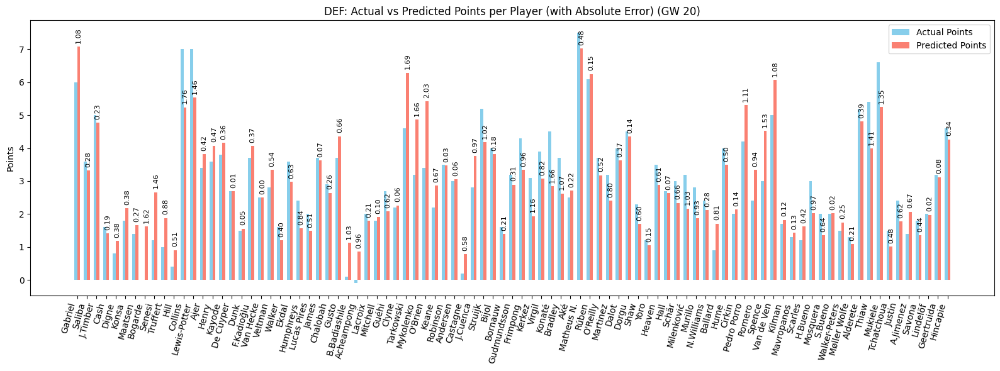

In [83]:
plot_preds(preds_df_20, 'DEF', 20)

###### MID


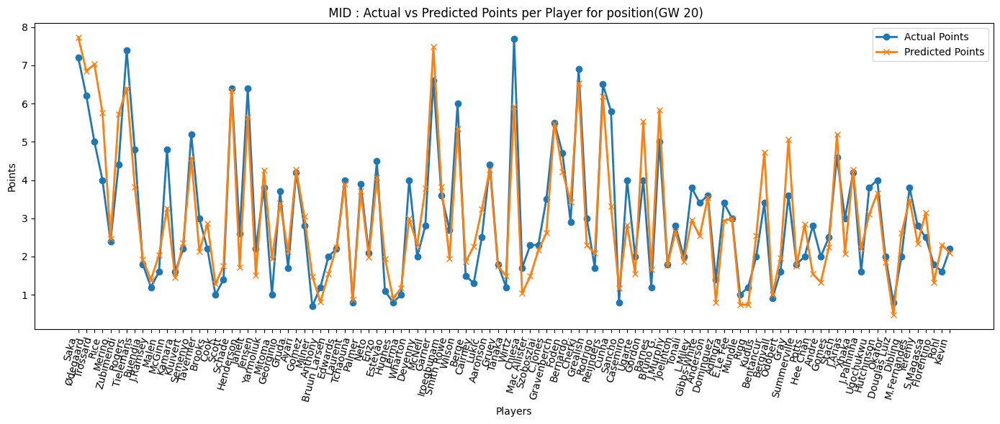

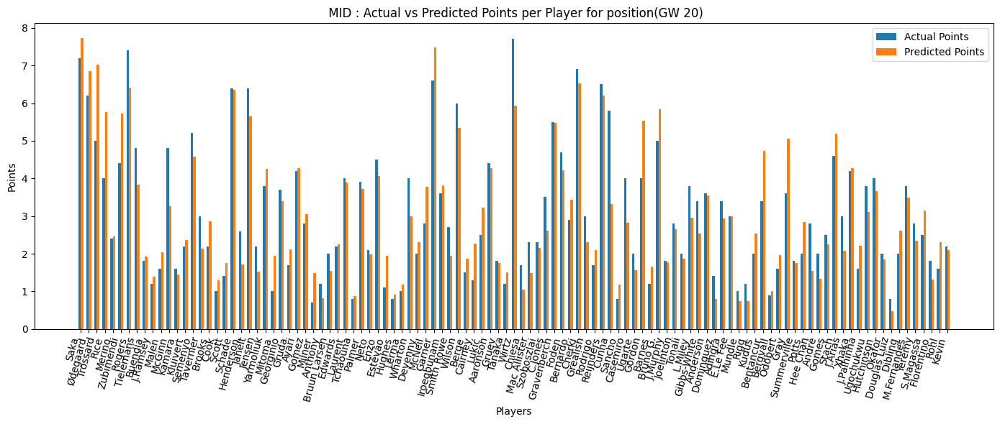

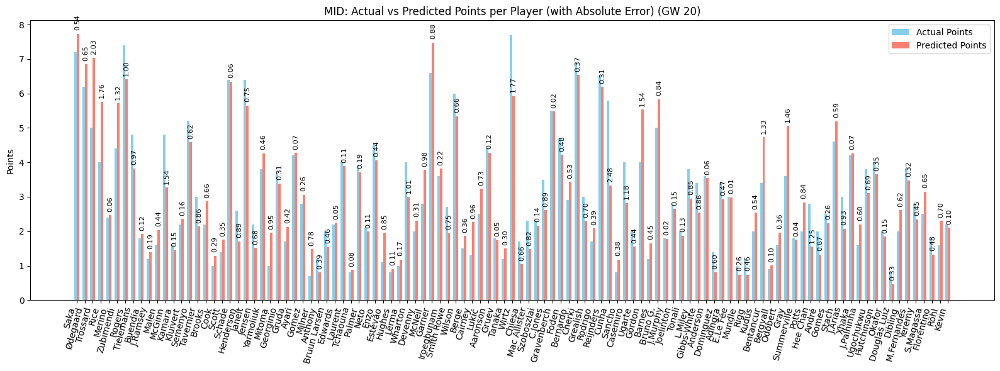

In [84]:
plot_preds(preds_df_20, 'MID', 20)

###### FWD


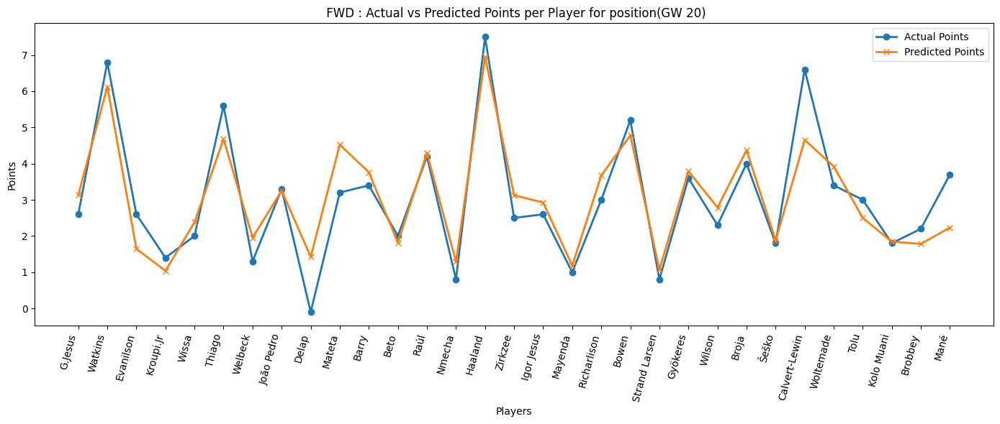

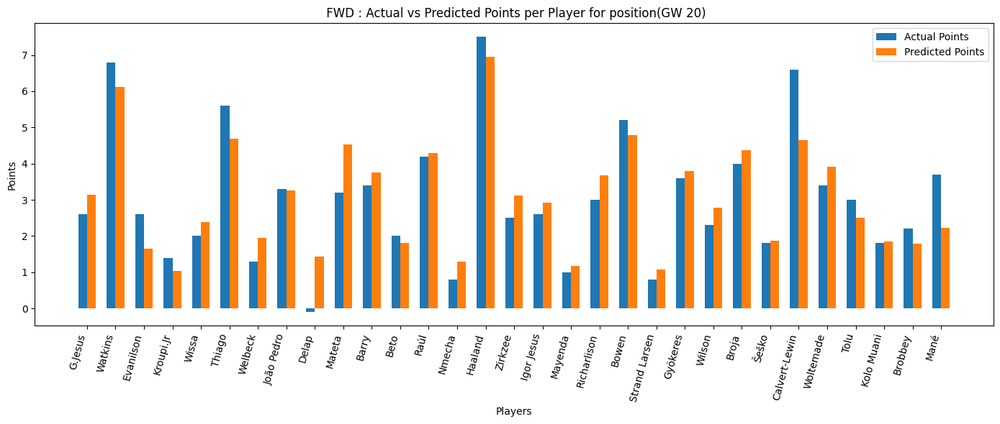

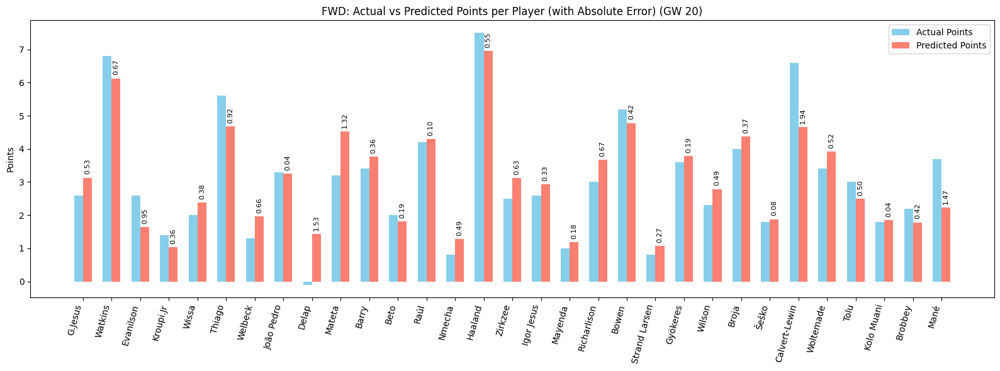

In [85]:
plot_preds(preds_df_20, 'FWD', 20)

### GW 21


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.9565 - mae: 0.4602 - mse: 0.2468 - val_loss: 0.8859 - val_mae: 0.4216 - val_mse: 0.2051 - learning_rate: 1.0000e-04
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.8126 - mae: 0.3329 - mse: 0.1409 - val_loss: 0.7543 - val_mae: 0.2900 - val_mse: 0.1095 - learning_rate: 1.0000e-04
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7054 - mae: 0.2199 - mse: 0.0697 - val_loss: 0.6577 - val_mae: 0.1822 - val_mse: 0.0494 - learning_rate: 1.0000e-04
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6371 - mae: 0.1553 - mse: 0.0380 - val_loss: 0.5958 - val_mae: 0.1246 - val_mse: 0.0242 - learning_rate: 1.0000e-04
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.5856 - mae: 0.1193 - mse: 0.0233 - val_loss: 0.5501 - val_mae: 0.0995 - val_mse: 0.0152 - learning_rate: 1.0000e-04
Epoch 6/100
67/6

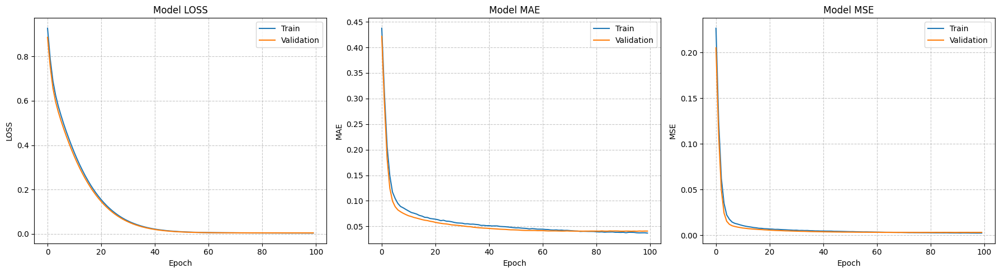


--- Final Test Set Evaluation (GW 21) ---
R²: 0.808015918726364801294
MAE: 0.521182640269398644861
MSE: 0.468941460705827872779
Loss: 0.004176310263574123383

--- Results for Gameweek 21 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
221,Rice,21.0,Arsenal,MID,6.8,7.576785
946,Collins,106.0,Brentford,DEF,8.0,7.421437
1094,Schade,120.0,Brentford,MID,6.3,7.167057
36,Gabriel,5.0,Arsenal,DEF,5.7,7.136664
4433,Bruno G.,488.0,Newcastle,MID,6.0,7.115347
...,...,...,...,...,...,...
5208,Bergvall,586.0,Spurs,MID,1.2,0.909808
6133,Diakité,685.0,Bournemouth,DEF,0.5,0.722152
1456,Hinshelwood,163.0,Brighton,MID,1.7,0.671417
1293,De Cuyper,145.0,Brighton,DEF,1.0,0.641054


In [86]:
history_21, evaluation_metrics_21, preds_df_21 = apnn_trainer(active_data_, cols, 21)
# Plot History
plot_training_history(history_21)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW 21) ---")
print(f"R²: {evaluation_metrics_21['test_R2']:.21f}")
print(f"MAE: {evaluation_metrics_21['test_mae']:.21f}")
print(f"MSE: {evaluation_metrics_21['test_mse']:.21f}")
print(f"Loss: {evaluation_metrics_21['test_loss']:.21f}")


print("\n--- Results for Gameweek 21 ---")
preds_df_21.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


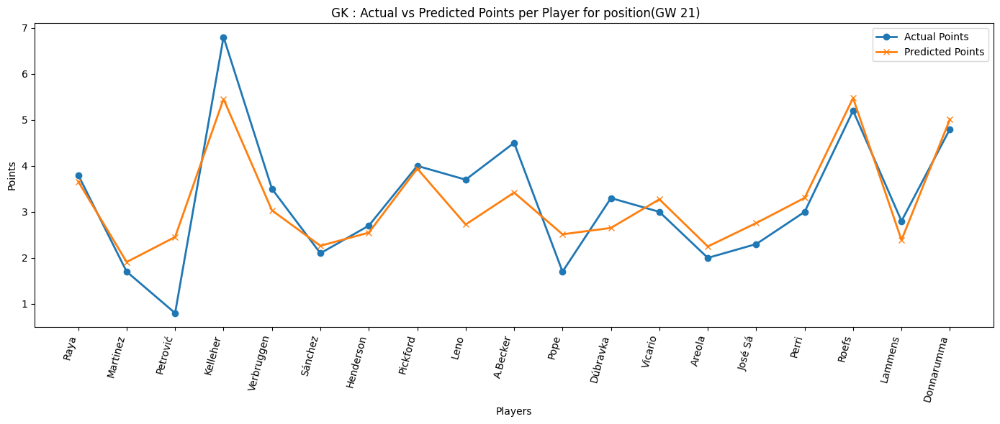

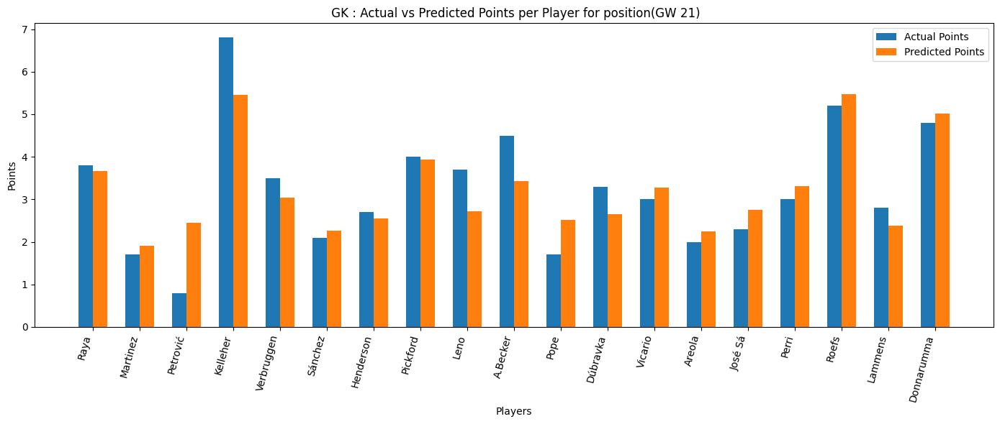

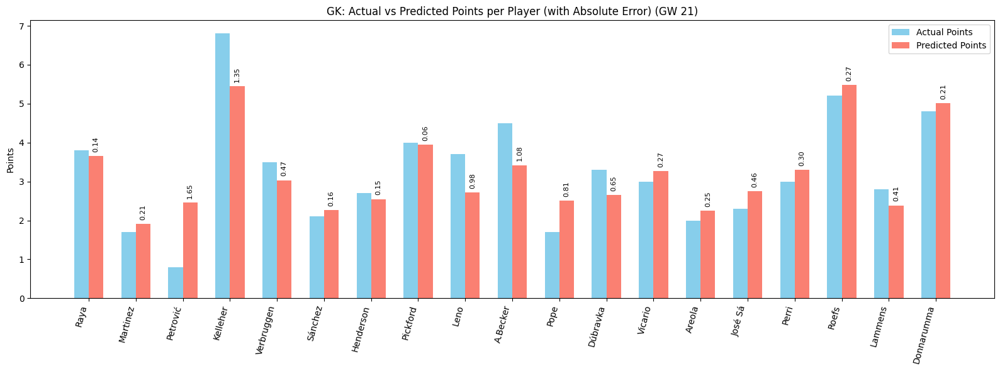

In [87]:
plot_preds(preds_df_21, 'GK', 21)


###### DEF


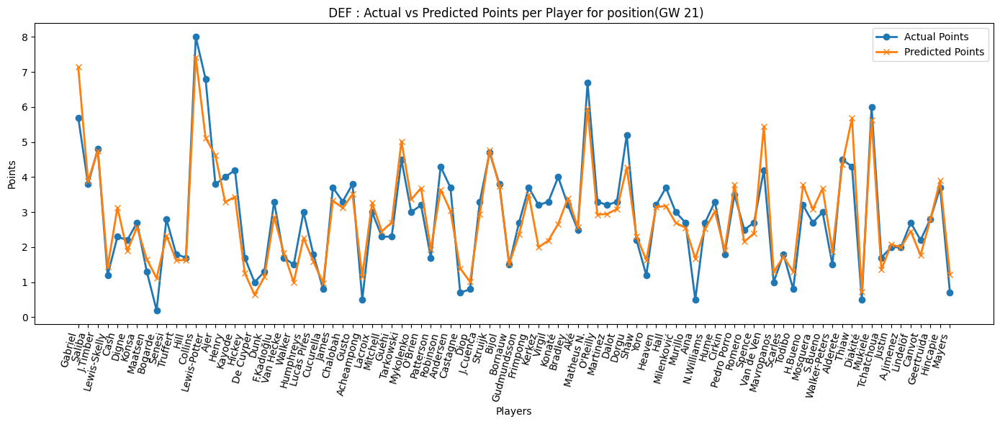

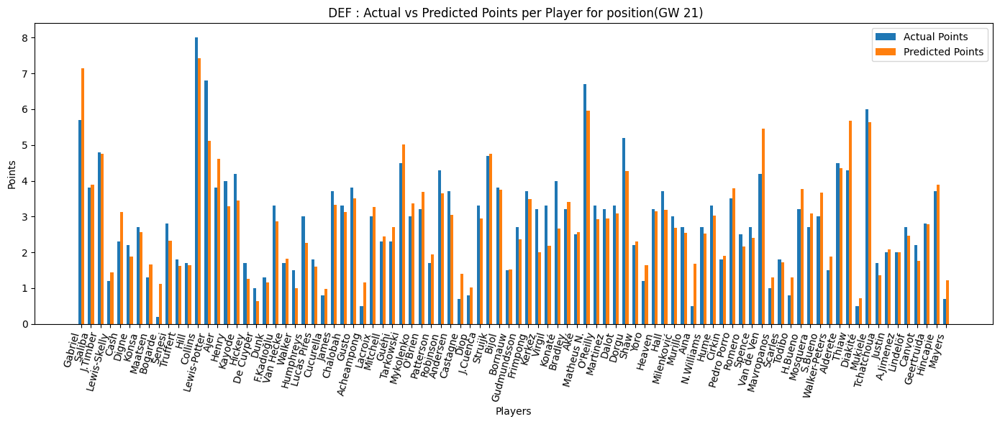

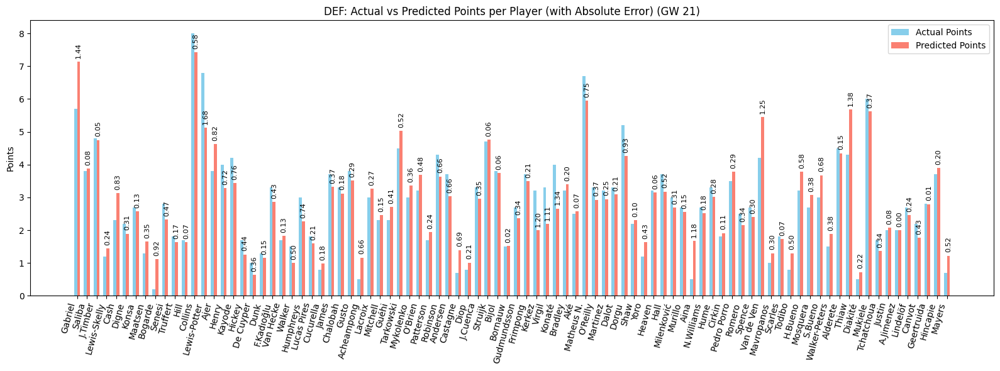

In [88]:
plot_preds(preds_df_21, 'DEF', 21)

###### MID


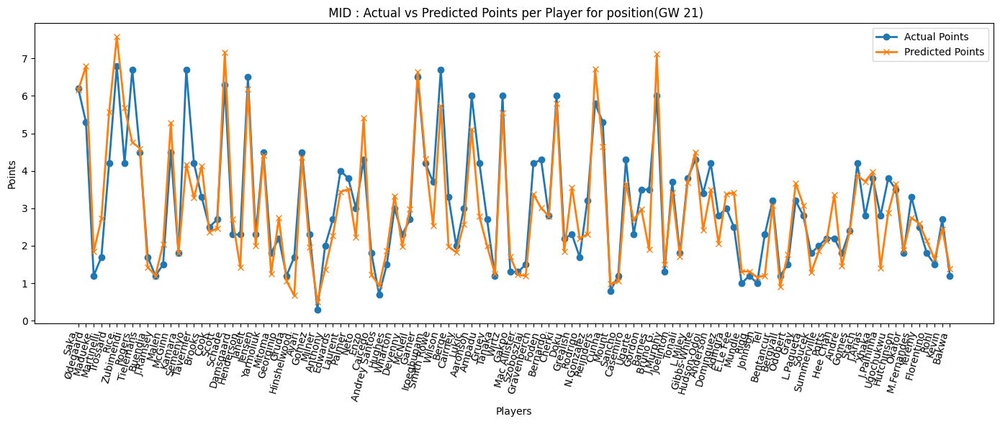

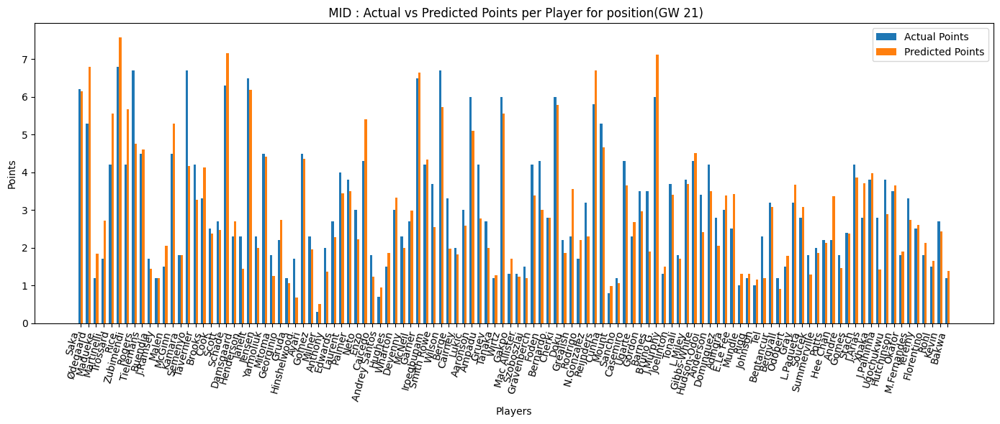

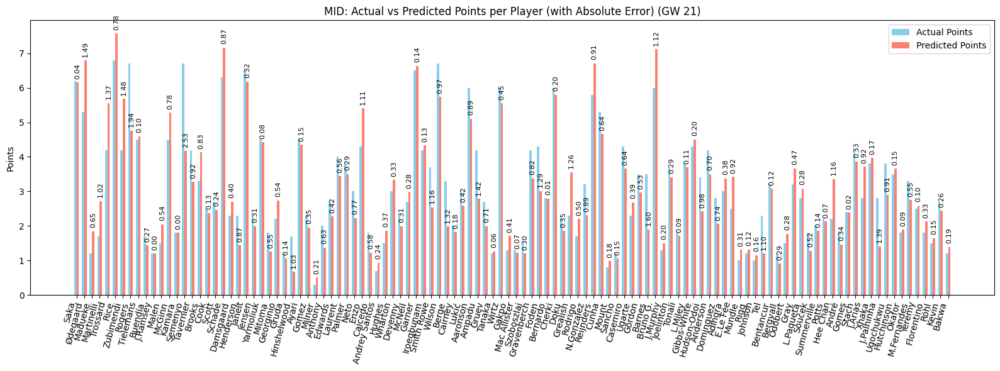

In [89]:
plot_preds(preds_df_21, 'MID', 21)

###### FWD


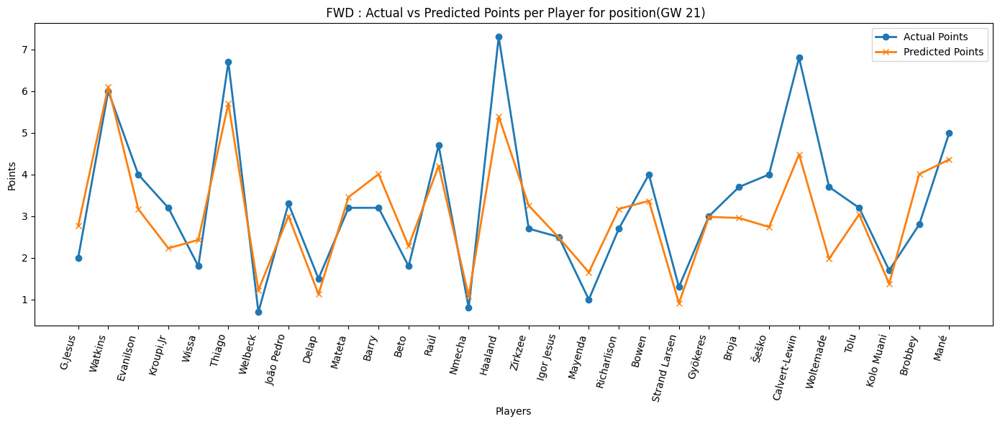

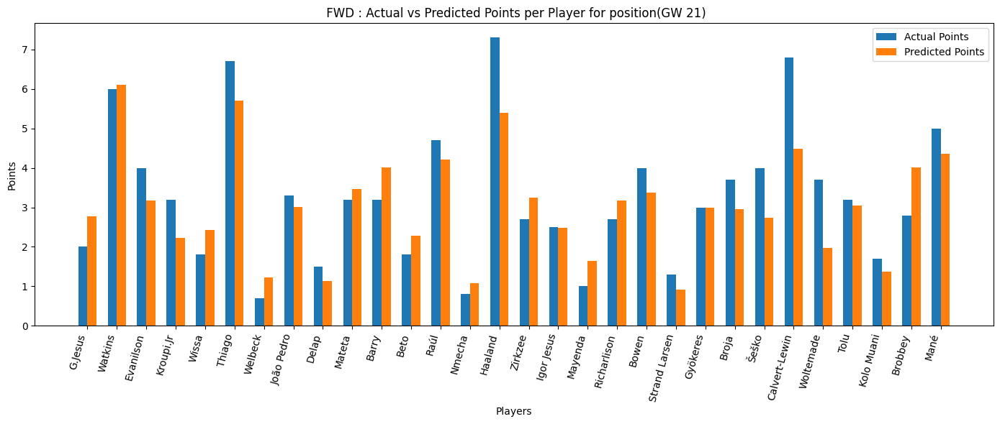

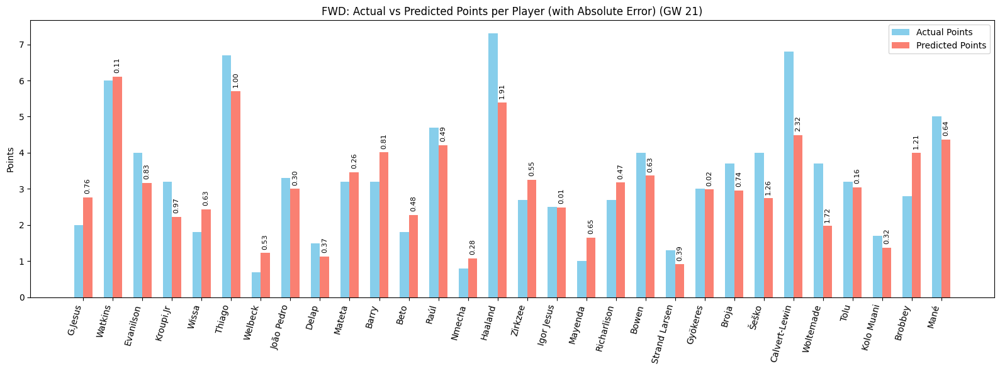

In [90]:
plot_preds(preds_df_21, 'FWD', 21)

## Results


In [100]:
evaluation_metrics_df =pd.DataFrame([evaluation_metrics_16, evaluation_metrics_17, evaluation_metrics_18, evaluation_metrics_19, evaluation_metrics_20, evaluation_metrics_21])
evaluation_metrics_df = evaluation_metrics_df.assign(round= [16, 17, 18, 19, 20, 21])
evaluation_metrics_df = evaluation_metrics_df.rename(columns={'test_R2': 'apnn_R2', 'test_mae': 'apnn_MAE', 'test_mse': 'apnn_MSE', 'test_loss': 'apnn_loss'})
evaluation_metrics_df[['round', 'apnn_R2', 'apnn_MAE', 'apnn_MSE', 'apnn_loss']].to_csv('apnn_evaluation_metrics_22.csv', index=False)
evaluation_metrics_df

,apnn_loss,apnn_MAE,apnn_MSE,apnn_R2,round
0,0.004439,0.620006,0.666801,0.794533,16
1,0.004115,0.599362,0.602874,0.823706,17
2,0.004314,0.562537,0.561910,0.825476,18
3,0.005154,0.626148,0.650276,0.784601,19
4,0.004745,0.591533,0.578794,0.790668,20
5,0.004176,0.521183,0.468941,0.808016,21


## Current


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.7871 - mae: 0.2263 - mse: 0.0798 - val_loss: 0.7311 - val_mae: 0.1795 - val_mse: 0.0569 - learning_rate: 1.0000e-04
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7018 - mae: 0.1528 - mse: 0.0389 - val_loss: 0.6562 - val_mae: 0.1252 - val_mse: 0.0270 - learning_rate: 1.0000e-04
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6410 - mae: 0.1179 - mse: 0.0231 - val_loss: 0.5998 - val_mae: 0.0971 - val_mse: 0.0154 - learning_rate: 1.0000e-04
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5903 - mae: 0.1025 - mse: 0.0170 - val_loss: 0.5521 - val_mae: 0.0852 - val_mse: 0.0115 - learning_rate: 1.0000e-04
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5449 - mae: 0.0952 - mse: 0.0149 - val_loss: 0.5086 - val_mae: 0.0792 - val_mse: 0.0099 - learning_rate: 1.0000e-04
Epoch 6/100
67/6

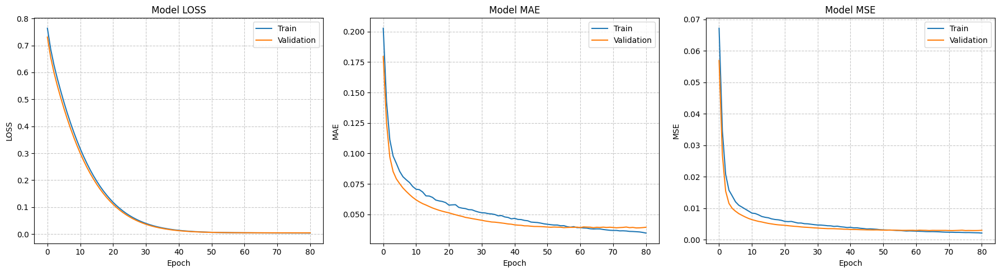


FINAL EVALUATION (Epoch 79)
Loss: 0.004319
MAE:  0.039033
MSE:  0.002897


--- Results for Gameweek 22 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
4434,Bruno G.,488.0,Newcastle,MID,0.0,8.274574
3922,Haaland,430.0,Man City,FWD,0.0,7.662968
2939,Wilson,329.0,Fulham,MID,0.0,7.658986
3736,Foden,414.0,Man City,MID,0.0,7.579064
1241,Thiago,136.0,Brentford,FWD,0.0,7.524849
...,...,...,...,...,...,...
6631,Bakwa,734.0,Nott'm Forest,MID,0.0,0.762723
6738,Groß,783.0,Brighton,MID,0.0,0.756558
431,Bogarde,44.0,Aston Villa,DEF,0.0,0.717631
6277,Douglas Luiz,699.0,Nott'm Forest,MID,0.0,0.600357


In [ ]:
history_22, evaluation_metrics_22, preds_df_22, scaler_y = apnn_trainer(active_data_, cols, 22)
# Plot History
plot_training_history(history_22)

# Extract evaluation metrics from the 'best' epoch
# Since restore_best_weights=True, the model's current weights match these metrics
best_epoch = np.argmin(history_22.history['val_loss'])

print("\n" + "="*30)
print(f"FINAL EVALUATION (Epoch {best_epoch + 1})")
print(f"Loss: {history_22.history['val_loss'][best_epoch]:.6f}")
print(f"MAE:  {history_22.history['val_mae'][best_epoch]:.6f}")
print(f"MSE:  {history_22.history['val_mse'][best_epoch]:.6f}")
print("="*30 + "\n")

eval_metrics = {
                'apnn_R2': np.nan,
                'apnn_MAE': (history_22.history['val_mae'][best_epoch] * scaler_y),
                'apnn_MSE': (history_22.history['val_mse'][best_epoch]* scaler_y**2),
                'apnn_loss': history_22.history['val_loss'][best_epoch]
                }
evaluation_metrics_df_22 = pd.DataFrame([eval_metrics])
evaluation_metrics_df_22 = evaluation_metrics_df_22.assign(round= [gw])

evaluation_metrics_df = pd.concat([evaluation_metrics_df, evaluation_metrics_df_22], ignore_index=True)



print(f"\n--- Results for Gameweek {gw} ---")
preds_df_22.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



In [105]:
evaluation_metrics_df

,apnn_loss,apnn_MAE,apnn_MSE,apnn_R2,round
0,0.004439,0.620006,0.666801,0.794533,16
1,0.004115,0.599362,0.602874,0.823706,17
2,0.004314,0.562537,0.561910,0.825476,18
3,0.005154,0.626148,0.650276,0.784601,19
4,0.004745,0.591533,0.578794,0.790668,20
5,0.004176,0.521183,0.468941,0.808016,21
6,0.004165,0.038211,0.002770,NaN,22


#### Plots


###### GK


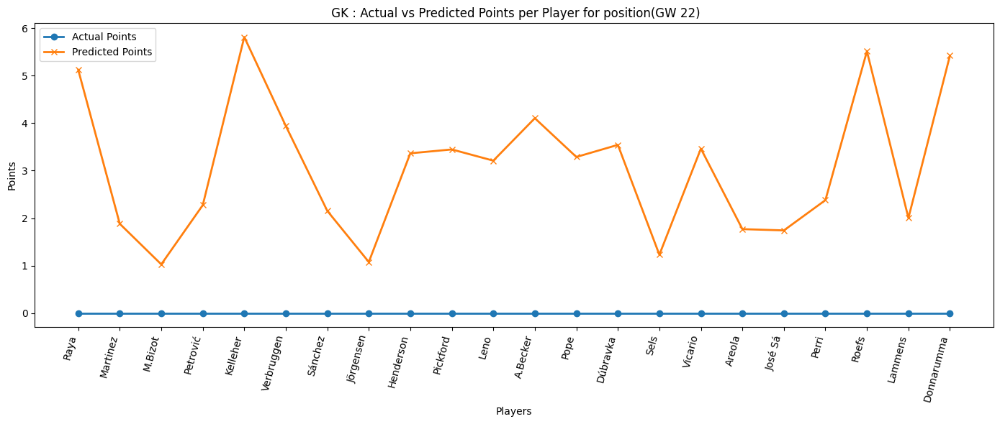

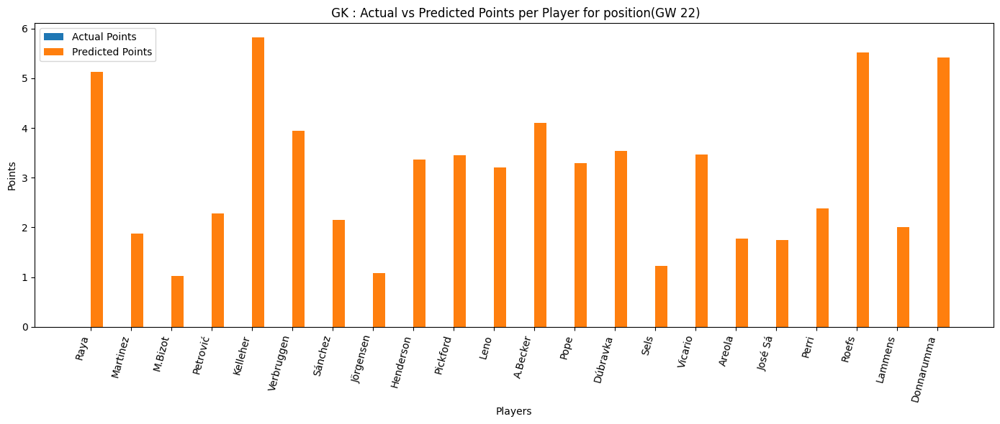

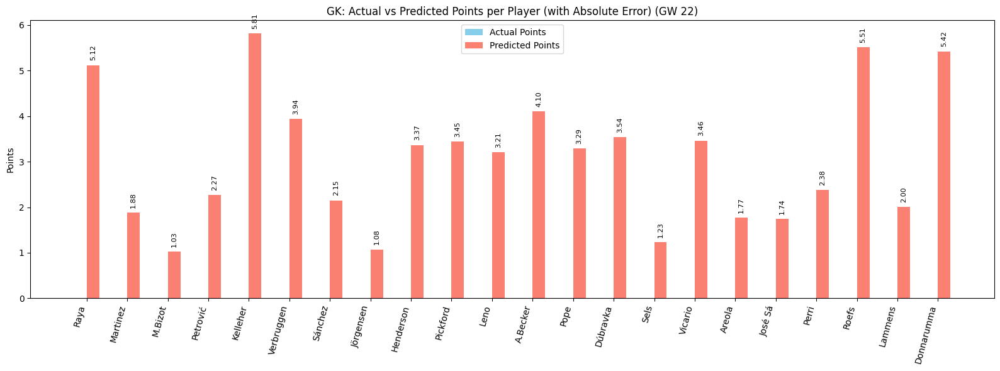

In [94]:
plot_preds(preds_df_22, 'GK', 22)


###### DEF


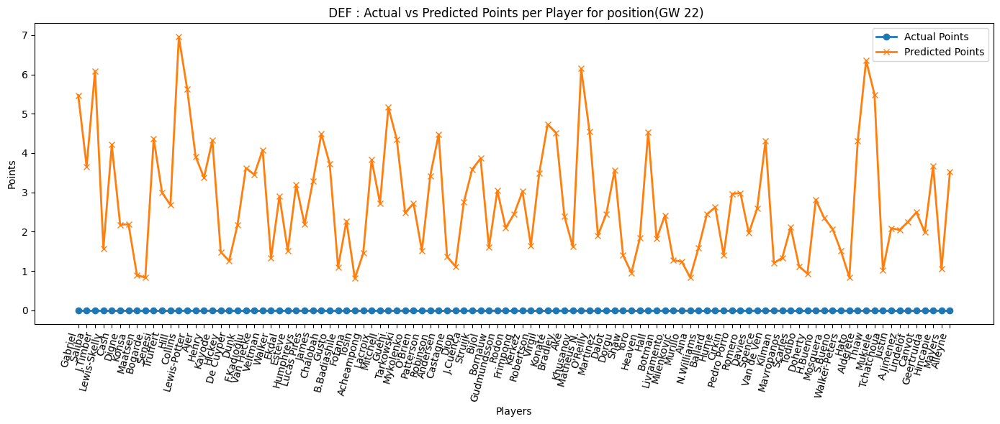

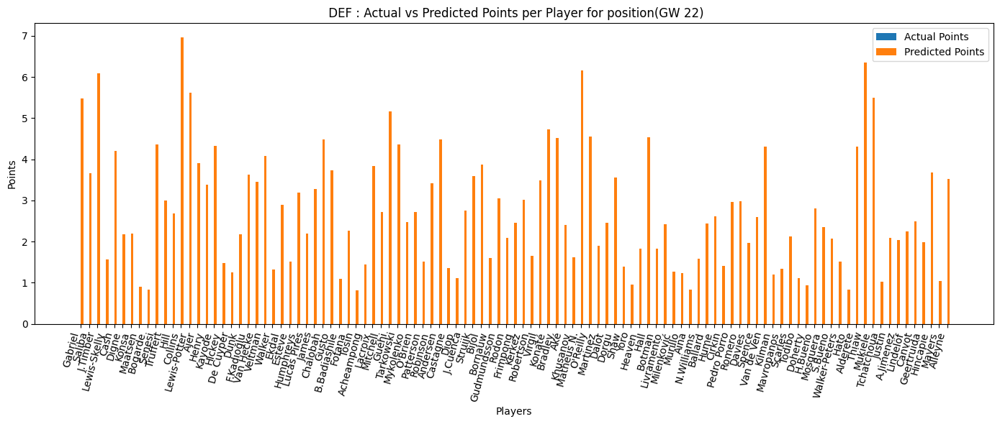

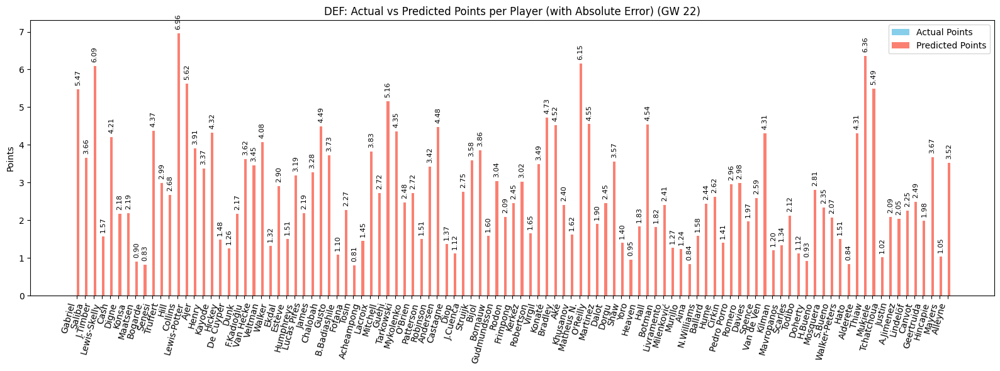

In [95]:
plot_preds(preds_df_22, 'DEF', 22)

###### MID


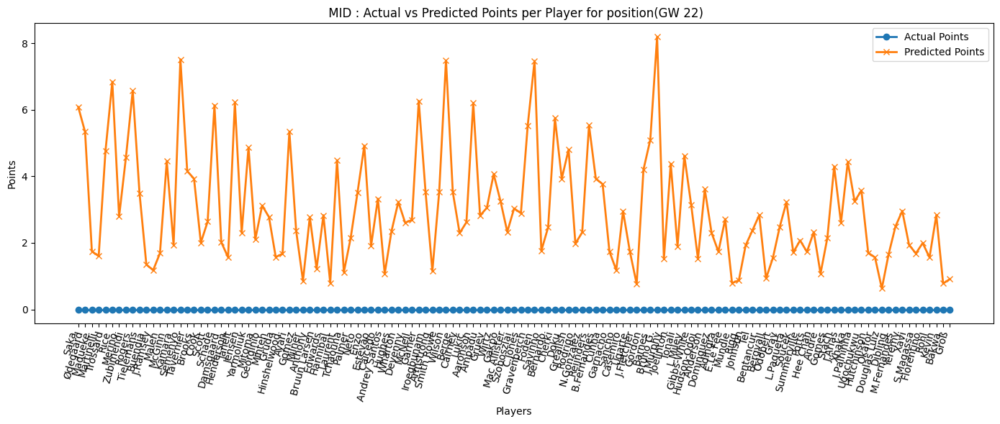

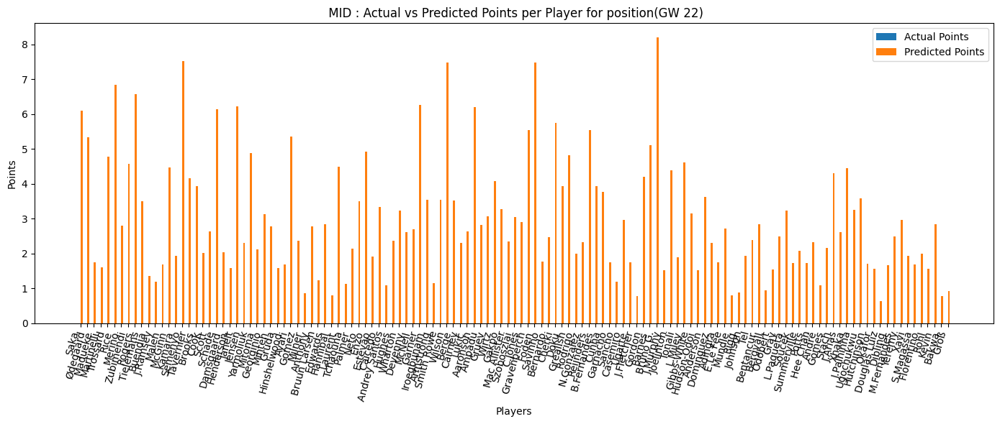

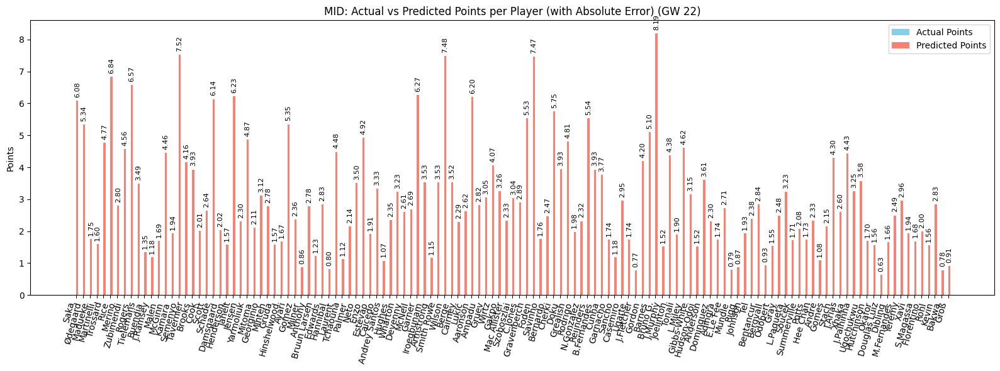

In [96]:
plot_preds(preds_df_22, 'MID', 22)

###### FWD


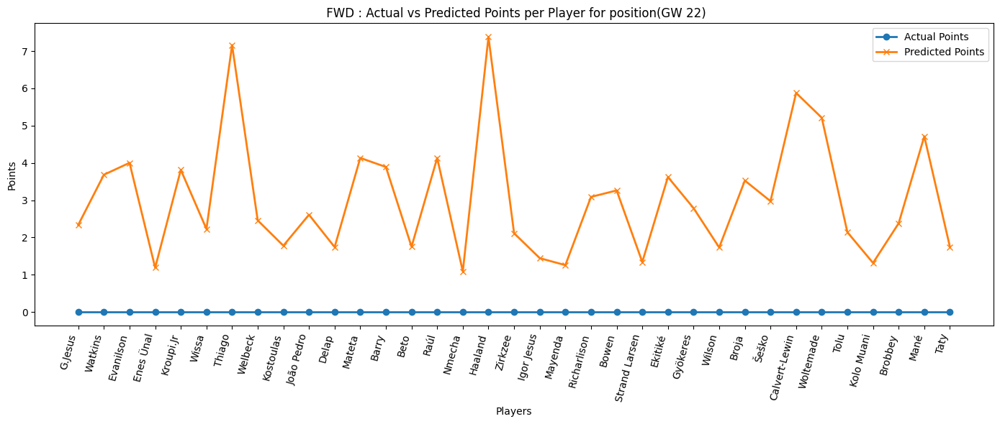

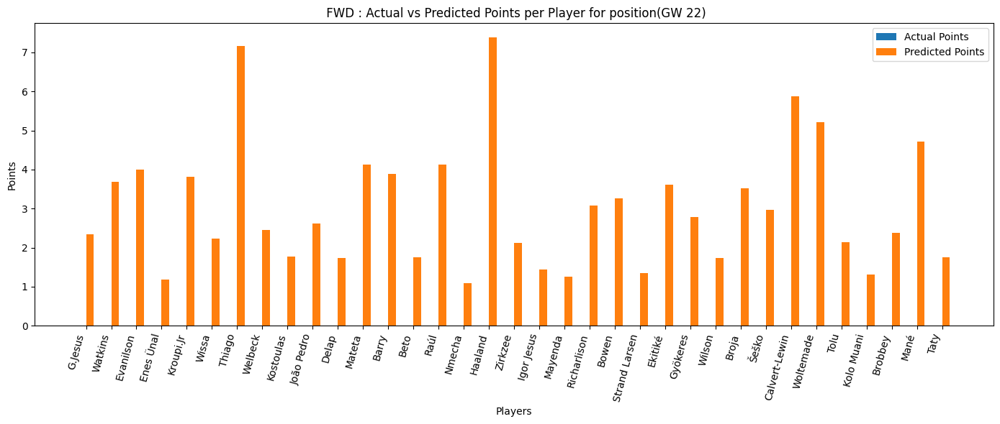

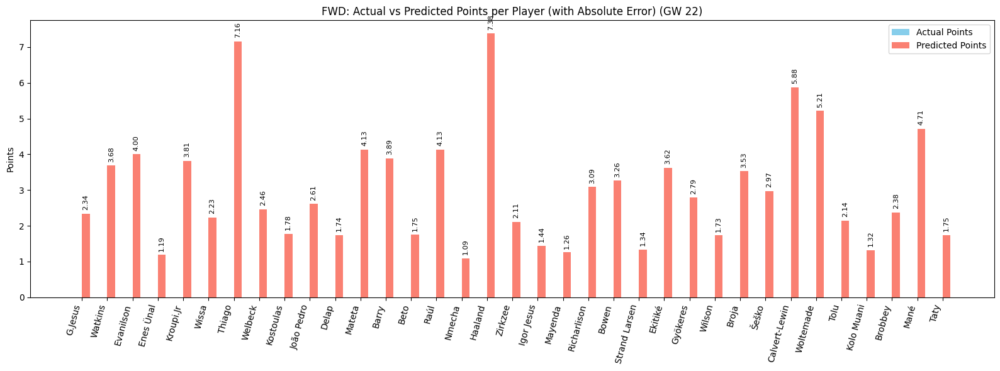

In [97]:
plot_preds(preds_df_22, 'FWD', 22)

# Save Preds


In [98]:
data_info = pd.read_csv('https://raw.githubusercontent.com/ilyandho/FPL-Optimal-Transfer/refs/heads/FantasyGo/Prediction%20with%20Affine%20PNN/data/rolled_player_data.csv')

data_info

,fpl_id,round,first_name,second_name,web_name,now_cost,selected_by_percent,form,event_points,transfers_in_event,...,strength_defence_home_1,strength_defence_home_3,strength_defence_home_5,strength_defence_away_1,strength_defence_away_3,strength_defence_away_5,opponent_team_name,opp_clean_sheets,opp_elo,opp_strength
0,1.0,1,David,Raya Martín,Raya,6.0,36.9,3.2,10.0,418466.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Arsenal,1.0,2037.000000,4.0
1,1.0,2,David,Raya Martín,Raya,5.5,21.5,8.0,6.0,77335.0,...,1290.0,0.0,0.0,1300.0,0.0,0.0,Arsenal,1.0,2037.000000,4.0
2,1.0,3,David,Raya Martín,Raya,5.5,21.8,6.0,2.0,38830.0,...,1290.0,0.0,0.0,1300.0,0.0,0.0,Arsenal,1.0,2037.000000,4.0
3,1.0,4,David,Raya Martín,Raya,5.5,23.5,6.0,6.0,33143.0,...,1290.0,1290.0,0.0,1300.0,1300.0,0.0,Arsenal,1.0,2037.000000,4.0
4,1.0,5,David,Raya Martín,Raya,5.5,24.0,4.0,2.0,95889.0,...,1290.0,1290.0,0.0,1300.0,1300.0,0.0,Arsenal,0.0,2037.000000,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6749,792.0,22,Alysson Edward Franco,da Rocha dos Santos,Alysson,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Aston Villa,0.0,1923.923218,3.0
6750,793.0,22,George,King,King,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Crystal Palace,0.0,1799.602295,3.0
6751,794.0,21,Max,Alleyne,Alleyne,4.5,0.0,4.0,4.0,745.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Man City,0.0,1983.000000,4.0
6752,794.0,22,Max,Alleyne,Alleyne,0.0,0.0,4.0,0.0,0.0,...,1290.0,430.0,258.0,1380.0,460.0,276.0,Man City,0.0,1982.901367,4.0


In [99]:
preds_df_16['round'] = 16
preds_df_17['round'] = 17
preds_df_18['round'] = 18
preds_df_19['round'] = 19
preds_df_20['round'] = 20
preds_df_21['round'] = 21
preds_df_22['round'] = 22

all_preds = pd.concat([preds_df_16, preds_df_17, preds_df_18, preds_df_19, preds_df_20, preds_df_21, preds_df_22], axis=0)
data_info = data_info.merge(all_preds [['fpl_id', 'round', 'Predicted_xP']], on=['fpl_id', 'round'], how='left')
data_info.to_csv('player_data_with_predictions.csv', index=False)